# The Heat Equation - Theory
- The model problem for the time-dependent PDE reads
$$
\begin{aligned}
\frac{\partial u}{\partial t} & =k(\mathbf{x},\omega)\nabla^2 u+f & & \text { in } \Omega \times(0, T], \\
u & =u_D=0 & & \text { in } \partial \Omega \times(0, T], \\
u & =u_0 & & \text { at } t=0 .
\end{aligned}
$$
- where
    - The variable $u$ is a function of both space and time, i.e., $u = u(\mathbf{x}, t)$, where the spatial domain is denoted by $\Omega(\mathbb{R}^{2})$.
    - The thermal diffusivity $\boldsymbol{x} \in \Omega=[-2,2] \times[-2,2]\subset \mathbb{R}^2$
    - The source function $f$ and boundary values $u_D$ may also vary with space and time.
    - The initial condition $u_0$ is defined in the spatial domain $\Omega(\mathbb{R}^{2})$.<br>

<br>

## Parameter Estimation Problem - Theory

Our uncertain paramater in this case is the thermal diffusivity $k(\mathbf{x})$.
Our observations consist of noisy observations of $u(x_j,t_i)$, that is, measurements of $u$ at locations $\{x_j\}_{j=1}^M$ in space and $\{t_i\}_{i=0}^{T}$ times.
Note that our parameter is now populated with noise that may be spatially varying and correlated.
Furthermore note that our uncertain parameter is now a function, and not just simple a point, so we need an effective way of parametrizing $k(\mathbf{x})$ for parameter estimation. 
This is where the KL expansion comes in


### The KL Expansion

We can describe $k(\boldsymbol{x})$ as a stochastic process, $K(\boldsymbol{x}, \omega)$, where $K$ is a function defined on the product
space $\boldsymbol{D} \times \Omega, \boldsymbol{x} \in \boldsymbol{D}$ is the index set of the location of the physical domain, and $\theta \in \Theta$ is
the sample space of the probability space, $(\Theta, \mathcal{F}, P)$.

Given a stochastic process $K(\boldsymbol{x}_{1}, \omega)$, with mean $\mu(\boldsymbol{x})$ and symmetric positive semi- 
definite covariance function $\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \in \Omega \times \Omega \to 
\mathbb{R}$, the Mercer theorem states that $\boldsymbol{C}$ can be decomposed as:
$$
\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right)=\sum_{j=1}^{\infty} \lambda_j \psi_j(\boldsymbol{x}) \psi_j\left(\boldsymbol{x}_{2}\right),
$$
where $\lambda_j>0$ are the eigenvalues of $\boldsymbol{C}$, and $\psi_j$ are the corresponding normalized eigenvectors. The eigenpairs satisfy the Fredholm equation of the second kind:
$$
\int_{\Omega} \boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \psi_j\left(\boldsymbol{x}_{2}\right) d \boldsymbol{x}_{2}=\lambda_j \psi_j(\boldsymbol{x}_{1}), \quad j=1,2, \ldots
$$
Sequencing the eigenvalues in decreasing order, any realization of $K$ can then be written as Ghanem and Spanos (2003)
$$
K(\boldsymbol{x}, \omega)=\mu(\boldsymbol{x})+\sum_{j=1}^{\infty} \sqrt{\lambda_j} \psi_j(\boldsymbol{x}) \xi_j(\omega) .
$$
The coordinate coefficients $\xi_j(\omega)$ can be deterministically computed by evaluating the integrals
$$
\xi_j(\omega)=\int(K(\boldsymbol{x}_{1}, \omega)-\mu(\boldsymbol{x})) \psi_j(\boldsymbol{x}) d \boldsymbol{x}
$$


### KL Expansion for Gaussian Processes

In our case, note $k(\mathbf{x})$ is a Gaussian process $(G P), \xi_j(\omega)$, i.e. it is a Gaussian-independent identically distributed random variables with zero mean and unit variance, such that $\mathbb{E}\left[\xi_j \xi_j^{\prime}\right]=$ $\delta_{j j^{\prime}}$.
The parameter field $K$ is then fully characterized by a set of coordinates $\xi_j$ 's given the eigenbasis is known.
By truncating the series givn above to retain the first few $K$ terms, the KL expansion efficiently approximates the highdimensional parameter field using a few dominant modes.
The size of the retained terms $K$ depends on the desired energy percentage to be retained by the $\mathrm{KL}$ expansion, which is defined as $\sum_{j=1}^K \lambda_j / \sum_{j=1}^{\infty} \lambda_j$.
In practice, it is preferable to choose $K$ such that the truncated $\mathrm{KL}$ expansion encapsulates as much information as possible with respect to its infinite counterpart.
Larger $K$ are required for prior covariance functions with smaller correlation lengths for the $\mathrm{KL}$ expansion to capture a similar information percentage.
There exist several strategies to set $K$ in practice.
For instance, for $\lambda_1 \geq \lambda_2 \geq \ldots$, one can control the representation error on $K$ by selecting $K$ such that $\lambda_K<c \lambda_1$ or $\sum_{j=1}^K \lambda_j \leq c \sum_{j=1}^{\infty} \lambda_j$ for some truncation parameter $c \ll 1$

### Creating the Covariance Matrix

The one thing remaining is to determine the Covariance function $C(x_1, x_2)$ for determining the modes of our KL basis.
The covariance function encodes how correlated spatially we expect our function values to be.
A common kernel used as a Covariance function is based off a square exponential function.

The square exponential kernel function can be represented mathematically as:

$$C(x_i, x_j) = \exp \left( -\frac{1}{2} \sum_{d=1}^{D} \left(\frac{x_{i,d} - x_{j,d}}{\ell_d}\right)^2\right)$$

where $x_i$ and $x_j$ are two $D$-dimensional input vectors, $\ell_d$ is the length scale for dimension $d$ and $\alpha=2$ is a constant.
The covariance matrix, $C$, can be constructed by evaluating this kernel function for each pair of input points and multiplying byhe $\sigma^2$:

$$ C_{i,j} = \sigma^2 * C(x_i, x_j) $$

Note the standard deviation can be specified to be constant over the whole grid, or can be the same size of the grid and specified cell wise. 
The $\sigma$ set should be related to the expected measurement noise in the observation operator.
Note furthermore the importance of the length scale parameters $\ell_d$. 
They in a sense define how smooth we believe our kernel to be.
The large $\ell_d$, the more square exponential kernel will smooth the sum of the different components over the space since they will overlap more.
The smaller the $\ell_d$, the rougher the field we want to represent.

# Case: Spatially and time varying forcing function

## Initial Conditions

- First Initial Condition: 
$$\exp\left[-\frac{1}{2} \left(\left(\frac{\boldsymbol{x}_{0}-0.01}{5}\right)^{2} + \left(\frac{\boldsymbol{x}_{1}-0.01}{5}\right)^{2} \right) \right]$$
- Second Inital Condition:
$$2* \exp\left[-0.1\left( \left(\boldsymbol{x}_{0}-1.0\right)^{2} + \left(\boldsymbol{x}_{1}-1.0\right)^{2} \right) \right]$$

In [1]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import importlib

from pydci import OnlineSequential
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

# Create initial condition
def initial_condition(x, a=5):
    return np.exp(-a * (x[0] ** 2 + x[1] ** 2))

class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            (10*np.sin(6 * np.pi * self.t) * x[0]
            + 10*np.cos(4 * np.pi * self.t) * x[1]),
        )

num_modes = 10
set_seed(2023)
enable_log(level="DEBUG")
heat_model_args = dict(
    x0=initial_condition,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.05,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=0.2,
    length_scales=[0.1, 0.1],
    nmodes=num_modes,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[08/16/23 18:43:42] INFO     Logger initialized                                                           ]8;id=718263;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=347854;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

In [2]:
hm = HeatModel(**heat_model_args)
hm.lam_true

                    DEBUG    Setting up simulation                                                 ]8;id=305797;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=498968;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#99\99]8;;\

[08/16/23 18:43:49] DEBUG    State idxs set at 500 of 2601 total indices                               ]8;id=614255;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=974055;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#100\100]8;;\

array([ 0.71167353, -0.32448496, -1.00187064,  0.23625079, -0.10215984,
       -1.14129263,  2.65440726,  1.44060519,  0.09890227, -3.12153215])

Text(0.5, 1.0, 'True Field $k(x)$')

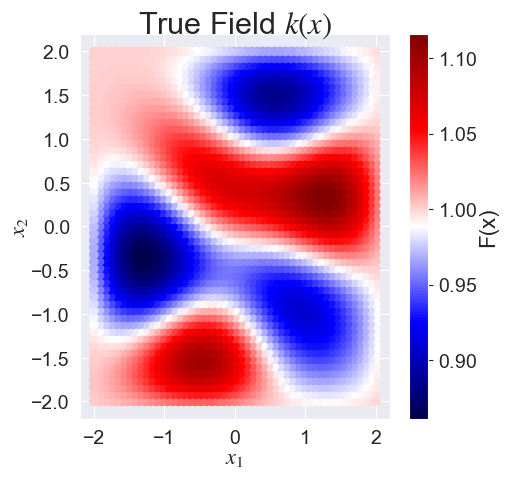

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
hm.plot_field(ax=ax, title='True field')
ax.set_title('True Field $k(x)$')

## Visualzing Solution Over full time

In [5]:
hm_full = HeatModel(**heat_model_args)
hm_full.get_data(tf=3.0)

[08/16/23 17:53:55] DEBUG    Setting up simulation                                                 ]8;id=459869;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=475898;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#99\99]8;;\

[08/16/23 17:54:01] DEBUG    State idxs set at 500 of 2601 total indices                               ]8;id=411580;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=527679;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#100\100]8;;\

                    INFO     Getting data for model from 0.0 to 3.0                                    ]8;id=542094;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=353473;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#389\389]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=639391;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=100280;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=63957;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=753401;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=335515;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=373033;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=285817;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=5760;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

[08/16/23 17:54:43] DEBUG    Shapes: (30000, 500), (30000, 2601), (30000,)                             ]8;id=979430;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=299379;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#404\404]8;;\

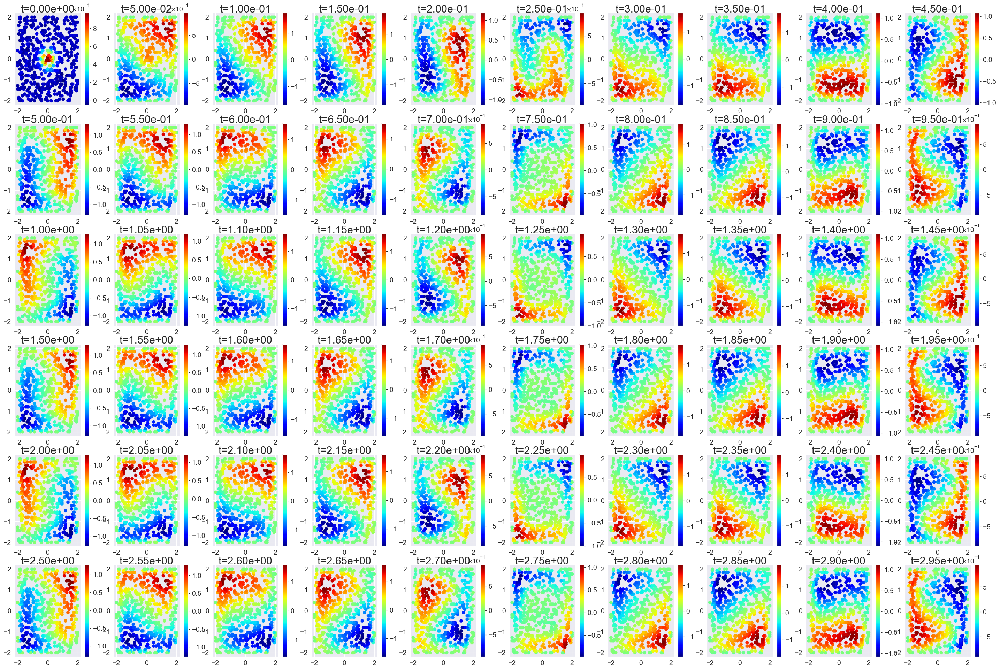

In [6]:
n_obs = hm_full.data[-1]['sample_flag'].sum()
hm_full.plot_obs_state(idxs=range(0, int(n_obs-1)))

### Visualizing using pyvista

In [10]:
snapshots = hm_full.take_snaps(hm_full.data[-1], sample_ts=0.005)
hm_full.output_gif(snapshots, gif_name="./u_time_forced_true.gif")
Image(url="./u_time_forced_true.gif")

|███████████████████████████████████████▉⚠︎ (!) 599/600 [100%] in 55.7s (10.75/s)                                        


In [11]:
hm_full.measurement_noise = 0.05
snapshots = hm_full.take_snaps(hm_full.data[-1], sample_ts=0.005, noise=True)
hm_full.output_gif(snapshots, gif_name="./u_time_forced_true_noisy.gif")
Image(url="./u_time_forced_true_noisy.gif")

|███████████████████████████████████████▉⚠︎ (!) 599/600 [100%] in 53.7s (11.14/s)                                        


# Parameter Estimation Problem

In [ ]:
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential')
prob = OnlineSequential(
    hm, # Use this to not use saved seed and start fresh - HeatModel(**heat_model_args),
    time_step=0.5,
)

## First Iteration

In [4]:
prob.solve(
    num_its=1,
    max_t=None,
    num_samples=100,
    max_sample_size=200,
    samples_inc=50,
    time_step=0.5,
    exp_thresh=0.2,
    kl_thresh=3.0,
    min_eff_sample_size=0.9,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 2.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
    seed=21, # Make sure different than seed set at beginning of notebook
)
prob.probs[-1].results

[08/16/23 16:54:14] INFO     Setting seed to 21                                             ]8;id=719777;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=449758;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#605\605]8;;\

                    INFO     No previous data -> Starting from initial                      ]8;id=945128;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=116525;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#610\610]8;;\

                    DEBUG    make_plots: False                                              ]8;id=497842;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=271943;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#648\648]8;;\

                    INFO     Starting online solve with 100 samples at data chunk 0         ]8;id=814175;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=11094;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#653\653]8;;\

                    DEBUG    Getting measurements over time window 0 to 1.0                 ]8;id=290659;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=616136;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 16:54:34] DEBUG    Starting solves for iteration 0                                ]8;id=135220;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=52032;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=825671;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=293647;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Starting from initial Reset:False, Data_Idx: 0                 ]8;id=320740;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=922784;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#493\493]8;;\
                             Sampling Args: {'dist': 'normal', 'mean': 0.0, 'std_dev': 2.0}                        
                             Solver Args: {'pca_range': range(1, 3), 'split_range':                                
                             range(1, 10), 'best_method': 'max_kl', 'all_data': True}                              

                    INFO     Advancing forward model for 100 samples                        ]8;id=850071;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=393311;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 17:12:49] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=438443;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=188432;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True}                                                                     

[08/16/23 17:12:56] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=914987;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=718606;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  1.154151  1.114973   1.00      0.78    True                                        
                             0  0.967018  0.351966   0.87      0.81    True                                        
                             0  0.981603  0.009257   0.86      0.86    True                                        
                             0  0.764526  1.218962   0.90      0.91   False                                        
                             0  0.945141  0.639030   0.95      0.89    True                                        
                             0  0.784303  0.514979   0.90      0.90   False                                        
                             0  0.742112  1.091177   0.89      0.92   False                                        
                             0  0.724424  0.750450   0.91      0.93   False                                        
                             0  0.727030  2.108723   1.00      0.92   False                                        
                             0  1.358999  1.837168   1.00      0.55   False                                        
                             0  1.142168  1.115615   0.69      0.58    True                                        
                             0  0.714631  2.662098   1.00      0.59   False                                        
                             0  0.767435  1.055646   0.79      0.76   False                                        
                             0  0.030254  2.261014   0.67      0.52   False                                        
                             0  0.034944  2.761101   0.66      0.60   False                                        
                             0  0.245235  2.564074   0.99      0.79   False                                        
                             0  0.638824  1.756959   1.00      0.96   False                                        
                             0  0.688620  2.385078   1.00      0.83   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             -0.066374  -1.097396                                                                  
                             0                                               None                                  
                             -0.066201  -0.054373                                                                  
                             0                                               None                                  
                             -0.767981  -1.838950                                                                  
                             0  Failed to solve problem on iteration 3 - |E(r)...                                  
                             -0.066201  -0.054373                                                                  
                             0                                               None                                  
                             1.571728   2.011985                                

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.154151,1.114973,1.00,0.78,True,None,-0.066374,-1.097396,-0.847769,0.067022,...,1,0,0.154151,True,True,False,False,False,100,False
0,0.967018,0.351966,0.87,0.81,True,None,-0.066201,-0.054373,0.977939,1.416388,...,2,1,0.032982,True,True,False,False,False,100,False
0,0.981603,0.009257,0.86,0.86,True,None,-0.767981,-1.838950,1.334153,0.241581,...,3,2,0.018397,True,True,True,False,True,100,False
0,0.764526,1.218962,0.90,0.91,False,Failed to solve problem on iteration 3 - |E(r)...,-0.066201,-0.054373,0.977939,1.416388,...,4,3,0.235474,True,False,False,False,False,100,False
0,0.945141,0.639030,0.95,0.89,True,None,1.571728,2.011985,0.816354,1.892004,...,5,4,0.054859,True,True,False,False,False,100,False
0,0.784303,0.514979,0.90,0.90,False,Failed to solve problem on iteration 4 - |E(r)...,0.904056,-1.764048,-2.020833,-2.107838,...,6,5,0.215697,True,False,False,False,False,100,False
0,0.742112,1.091177,0.89,0.92,False,Failed to solve problem on iteration 5 - |E(r)...,-0.767981,-1.838950,1.334153,0.241581,...,7,6,0.257888,True,False,False,False,False,100,False
0,0.724424,0.750450,0.91,0.93,False,Failed to solve problem on iteration 6 - |E(r)...,1.473006,-2.392909,-0.204003,-0.246630,...,8,7,0.275576,True,False,False,False,False,100,False
0,0.727030,2.108723,1.00,0.92,False,Failed to solve problem on iteration 4 - |E(r)...,-3.293920,0.000804,0.588691,-1.158225,...,9,8,0.272970,True,False,False,False,False,100,False
0,1.358999,1.837168,1.00,0.55,False,Failed to solve problem on iteration 1 - |E(r)...,-0.066374,-1.097396,-0.847769,0.067022,...,1,9,0.358999,True,False,False,False,False,100,False


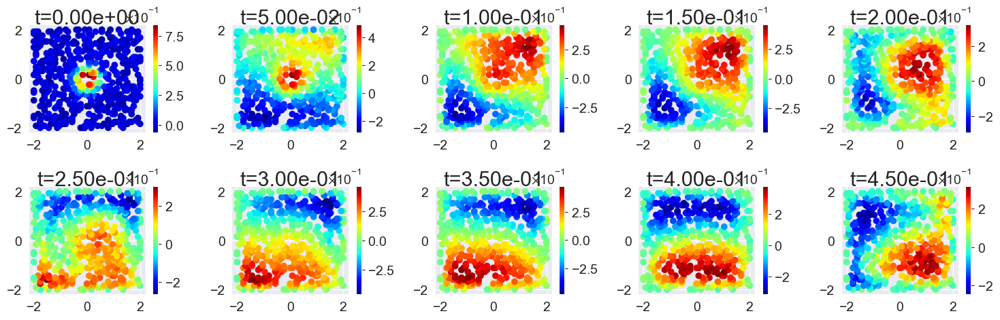

In [5]:
hm.plot_obs_state(idxs=range(10), figsize=(15, 5))
plt.tight_layout()

In [6]:
import pandas as pd
prob_best = prob.probs[0].best
print(prob_best)

            DCI Problem             
┌─────────────┬────────────────────┐
│ num_samples │ 100                │
│ num_params  │ 10                 │
│ num_states  │ 10                 │
│ mem_usage   │ 8.03 KB            │
│ solved      │ True               │
│ e_r         │ 1.1421684938669563 │
│ kl          │ 1.1156148235817336 │
│ error       │ None               │
└─────────────┴────────────────────┘

In [7]:
pd.concat(prob_best.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,1.083940,1.836210,1.00,0.69,True,None,-0.136312,-1.394474,0.424921,-0.359335,...,0.883022,-0.071677,0.868299,-0.536036,-1.716901,0,"[0, 1]","range(0, 5250)",1,2
0,1.142168,1.115615,0.69,0.58,True,None,-1.306684,-1.428800,1.030407,0.171010,...,-0.549844,1.186251,-0.547166,0.152299,1.679207,51,"[0, 1]","range(5250, 10500)",2,2


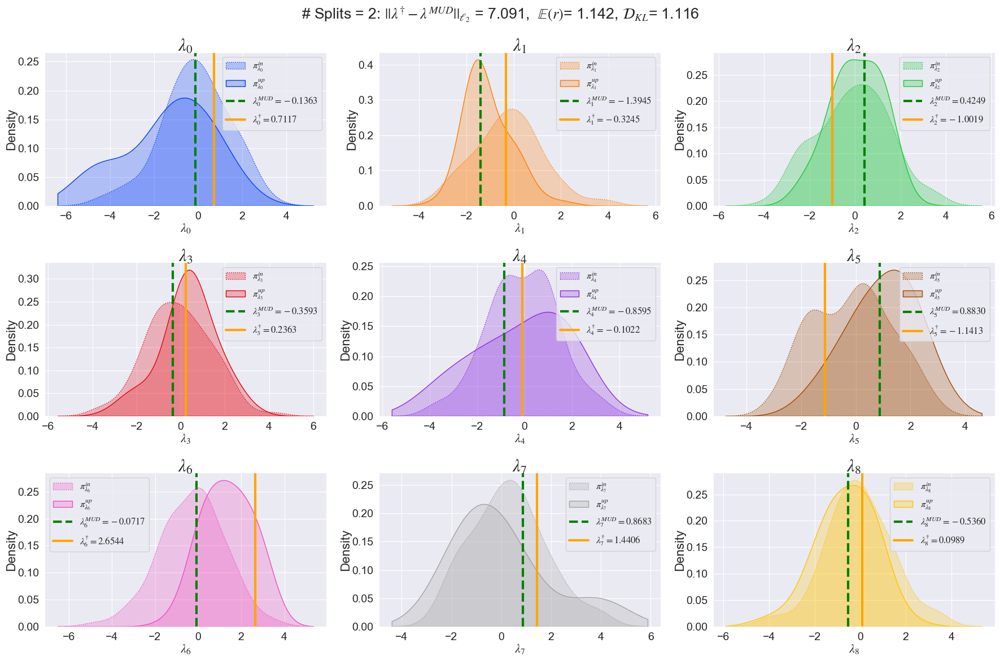

In [9]:
prob_best.param_density_plots(lam_true=hm.lam_true, iteration=0)

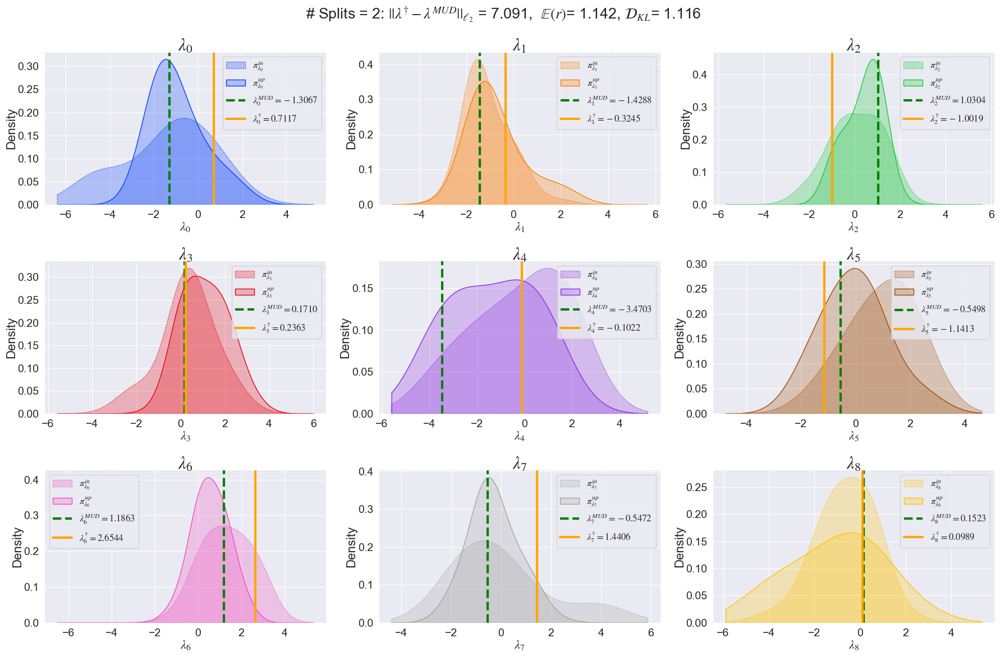

In [10]:
prob_best.param_density_plots(lam_true=hm.lam_true, iteration=1)

In [1]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

mud_point = prob_best.get_mud_point(iteration=0)[1][0]

hm.plot_field(ax=ax[0])
ax[0].set_title("$k^{\dagger}(x)")
hm.plot_field(field=mud_point, ax=ax[1])
ax[1].set_title("$k^{MUD}(x)$")
hm.plot_field(diff=mud_point, ax=ax[2])
ax[2].set_title("Error")

fig.tight_layout()

NameError: name 'plt' is not defined

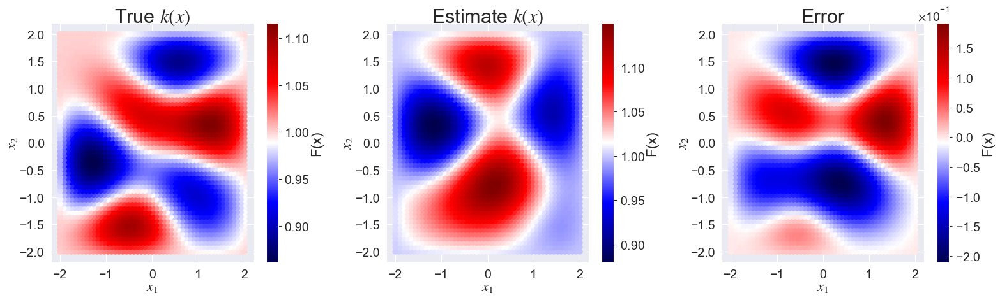

In [12]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

mud_point = prob_best.get_mud_point(iteration=1)[1][0]

hm.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm.plot_field(field=mud_point, ax=ax[1])
ax[1].set_title(f"Estimate $k(x)$")
hm.plot_field(diff=mud_point, ax=ax[2])
ax[2].set_title("Error")

fig.tight_layout()

In [26]:
np.prob_best.state

,weight,pi_in,pi_pr,pi_obs,ratio,pi_up,q_lam_0,q_lam_1,q_lam_2,q_lam_3,...,q_pca_2,q_pca_3,q_pca_4,q_pca_5,q_pca_6,q_pca_7,q_pca_8,q_pca_9,weighted_ratio,pred_assumption
0,6.592915e+00,7.092915e-05,2.439178e-02,5.565549e-04,2.281732e-02,1.067006e-05,0.038611,-0.021520,-0.028740,0.006955,...,0.843150,1.519772,-3.642482,-1.880081,-5.147475,6.527582,-0.764764,-1.760084,1.504326e-01,True
1,1.066946e-37,6.560662e-36,4.548131e-04,3.693547e-07,8.121022e-04,5.684609e-76,-0.007573,-0.036170,0.026144,0.007202,...,7.612199,3.774116,-7.276701,2.601708,-1.262921,5.254400,-1.982255,-4.183783,8.664688e-41,True
2,6.237084e-04,6.676585e-09,6.292428e-05,7.044755e-12,1.119561e-07,4.662122e-19,0.016827,0.000168,-0.009340,-0.041466,...,-2.032029,1.172696,-3.533871,-4.096212,-3.912548,4.955221,-0.251442,-1.636893,6.982794e-11,True
3,9.718384e-09,1.042246e-13,2.855805e-04,2.753979e-04,9.643440e-01,9.767789e-22,-0.027008,-0.013950,-0.000776,0.010013,...,6.555940,-2.007723,-2.005814,-0.920746,-1.822450,10.246551,-2.931923,-1.026305,9.371866e-09,True
4,4.718388e-10,5.053692e-15,2.981959e-02,2.217422e-06,7.436124e-05,1.773164e-28,-0.004226,0.006358,-0.001112,-0.020445,...,3.552069,3.236917,-6.581551,0.515507,-0.060873,4.269686,-0.362135,-1.121328,3.508652e-14,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1.290796e-02,1.381806e-07,1.403423e-03,1.136056e-05,8.094895e-03,1.443829e-11,-0.002888,0.029814,0.004209,-0.026475,...,3.273320,-0.279065,-5.284005,1.893003,-3.837269,5.201210,-3.896879,-2.092890,1.044886e-04,True
96,2.830240e-05,3.039591e-10,7.491745e-05,1.640687e-05,2.189992e-01,1.884000e-15,0.000744,0.014294,0.027538,-0.020853,...,3.181662,3.599112,-1.245470,-3.058387,-2.421775,7.401539,-2.126145,-1.393022,6.198204e-06,True
97,4.161772e-10,4.466069e-15,1.787501e-05,4.890476e-07,2.735930e-02,5.085207e-26,0.009573,0.012509,-0.004724,-0.015431,...,1.452772,6.653784,-1.799907,-3.053923,-2.096020,2.493715,-0.681374,-2.509587,1.138632e-11,True
98,9.048786e-11,9.685956e-16,3.745002e-02,3.270297e-05,8.732430e-04,7.653638e-29,0.002973,-0.027114,0.012087,-0.017547,...,6.189434,-0.284419,-0.528763,-2.900976,-1.595682,2.969384,0.562504,-2.255426,7.901789e-14,True


### Other Solutions

In [13]:
search_prob = prob.probs[0]
search_prob.results[search_prob.results['valid']]

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.154151,1.114973,1.00,0.78,True,None,-0.066374,-1.097396,-0.847769,0.067022,...,1,0,0.154151,True,True,False,False,False,100,False
0,0.967018,0.351966,0.87,0.81,True,None,-0.066201,-0.054373,0.977939,1.416388,...,2,1,0.032982,True,True,False,False,False,100,False
0,0.981603,0.009257,0.86,0.86,True,None,-0.767981,-1.838950,1.334153,0.241581,...,3,2,0.018397,True,True,True,False,True,100,False
0,0.945141,0.639030,0.95,0.89,True,None,1.571728,2.011985,0.816354,1.892004,...,5,4,0.054859,True,True,False,False,False,100,False
0,1.142168,1.115615,0.69,0.58,True,None,-1.306684,-1.428800,1.030407,0.171010,...,2,10,0.142168,True,True,False,True,False,100,False


#### Closest Solution

In [14]:
sol = search_prob.probs[2]
print(sol)

             DCI Problem              
┌─────────────┬──────────────────────┐
│ num_samples │ 100                  │
│ num_params  │ 10                   │
│ num_states  │ 10                   │
│ mem_usage   │ 8.03 KB              │
│ solved      │ True                 │
│ e_r         │ 0.9816026710531566   │
│ kl          │ 0.009256925287048757 │
│ error       │ None                 │
└─────────────┴──────────────────────┘

In [16]:
pd.concat(sol.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,1.111794,0.560092,1.00,0.96,True,None,-0.066374,-1.097396,-0.847769,0.067022,...,-1.624585,1.063185,-0.502144,0.067500,-0.585339,70,[0],"range(0, 3500)",1,3
0,1.058402,0.456281,0.96,0.86,True,None,0.198237,-3.421450,2.080149,-1.179325,...,-1.757196,0.957164,2.533070,1.421171,-0.834228,6,[0],"range(3500, 7000)",2,3
0,0.981603,0.009257,0.86,0.86,True,None,-0.767981,-1.838950,1.334153,0.241581,...,1.689739,2.028249,3.911774,0.663058,-2.360864,16,[0],"range(7000, 10500)",3,3


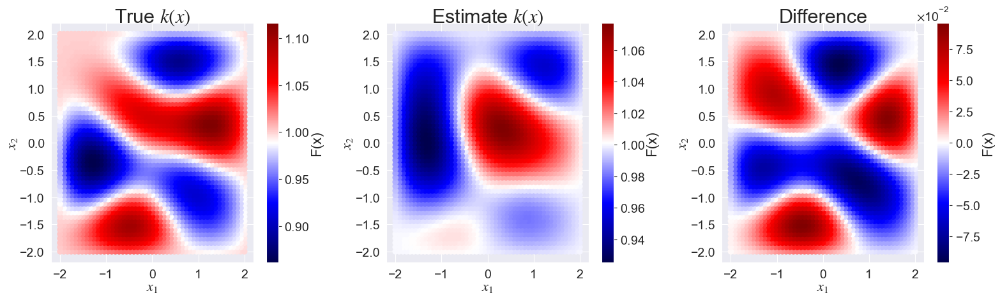

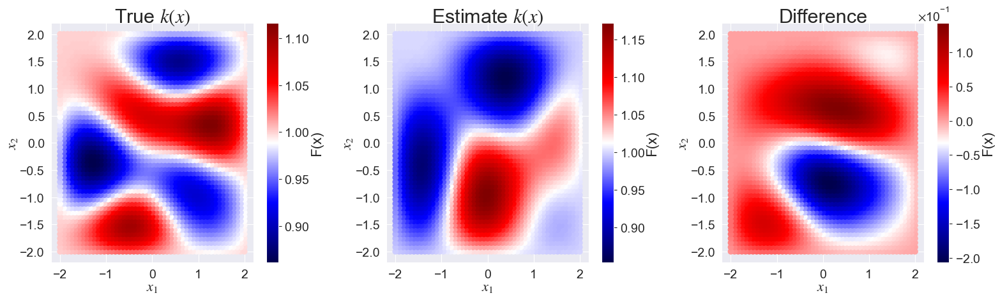

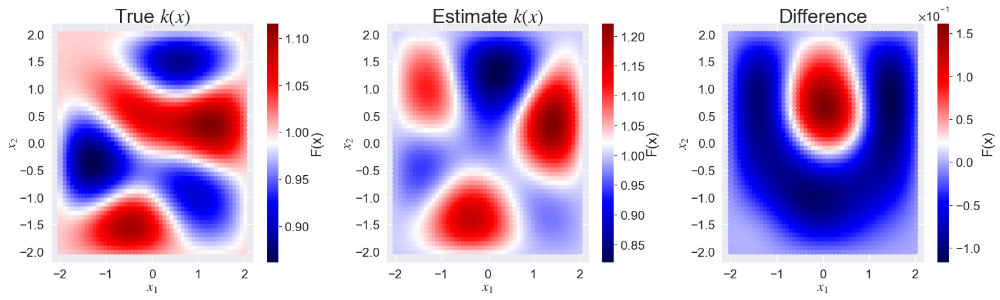

In [19]:
for i, res in enumerate(sol.results):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = sol.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("Difference")

    fig.tight_layout()

#### Five Splits Solution

In [27]:
sol = search_prob.probs[4]
print(sol)

            DCI Problem             
┌─────────────┬────────────────────┐
│ num_samples │ 100                │
│ num_params  │ 10                 │
│ num_states  │ 10                 │
│ mem_usage   │ 8.03 KB            │
│ solved      │ True               │
│ e_r         │ 0.9451414505208663 │
│ kl          │ 0.639030454113801  │
│ error       │ None               │
└─────────────┴────────────────────┘

In [28]:
pd.concat(sol.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,1.010321,0.412416,1.00,1.00,True,None,-0.136312,-1.394474,0.424921,-0.359335,...,0.883022,-0.071677,0.868299,-0.536036,-1.716901,0,[0],"range(0, 2100)",1,5
0,1.080703,0.187950,1.00,0.94,True,None,-0.136312,-1.394474,0.424921,-0.359335,...,0.883022,-0.071677,0.868299,-0.536036,-1.716901,0,[0],"range(2100, 4200)",2,5
0,1.076865,0.118440,0.94,0.91,True,None,1.378479,-0.643595,1.023123,-1.479334,...,-2.208914,1.012212,1.399805,1.157651,-2.212352,29,[0],"range(4200, 6300)",3,5
0,0.818167,0.952192,0.91,0.95,True,None,-0.066201,-0.054373,0.977939,1.416388,...,2.409793,2.038237,1.365101,-0.017403,-0.293598,60,[0],"range(6300, 8400)",4,5
0,0.945141,0.639030,0.95,0.89,True,None,1.571728,2.011985,0.816354,1.892004,...,0.605337,0.360891,-0.818057,2.103099,-1.880405,92,[0],"range(8400, 10500)",5,5


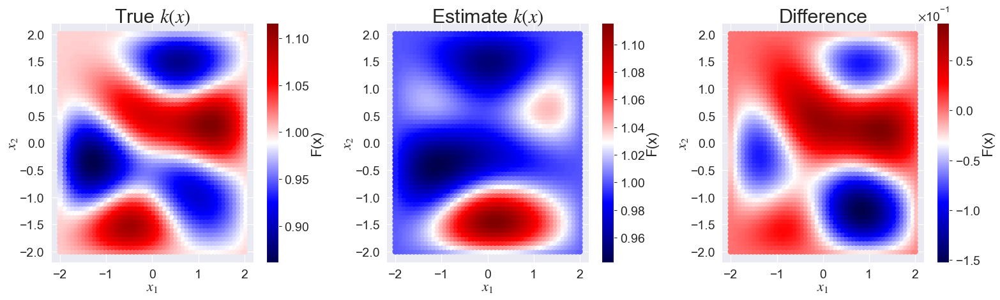

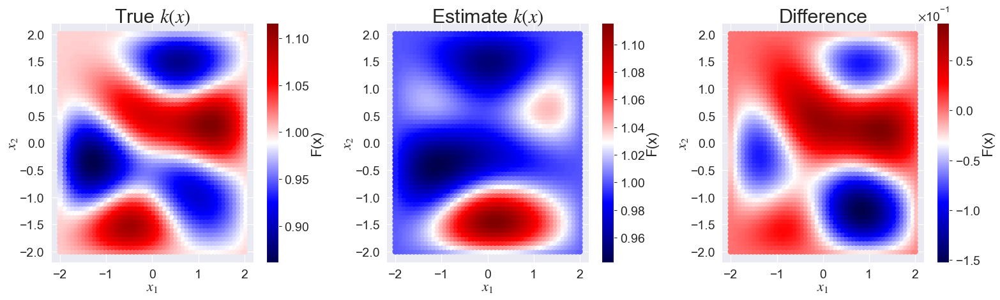

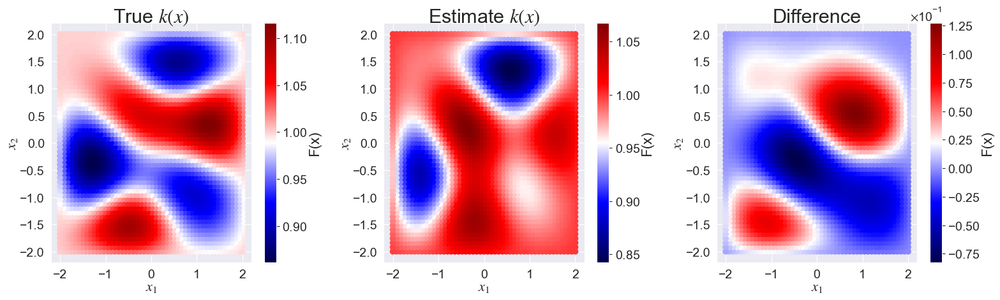

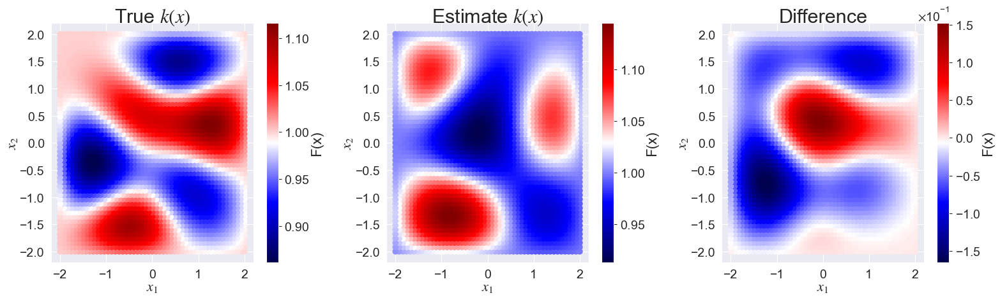

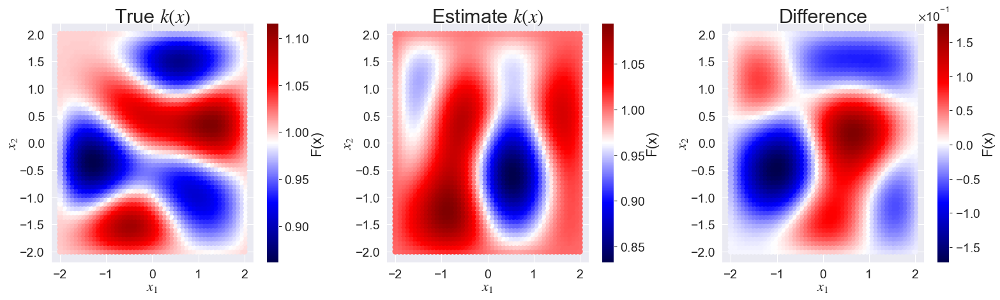

In [29]:
for i, res in enumerate(sol.results):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = sol.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("Difference")

    fig.tight_layout()

## Second Iteration



In [15]:
# disable_log()
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential')
prob.solve(
    num_its=1,
    max_t=None,
    num_samples=100,
    max_sample_size=200,
    samples_inc=50,
    time_step=0.5,
    exp_thresh=0.25,
    kl_thresh=3.0,
    min_eff_sample_size=1.0,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 1.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
)
prob.probs[-1].results

[08/16/23 16:03:22] INFO     Starting from iteration 1                                      ]8;id=253570;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=718068;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#630\630]8;;\

                    DEBUG    make_plots: False                                              ]8;id=814139;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=575945;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#648\648]8;;\

                    INFO     Starting online solve with 50 samples at data chunk 1          ]8;id=169024;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=289649;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#653\653]8;;\

                    DEBUG    Getting measurements over time window 0.5 to 1.0               ]8;id=399149;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=868580;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 16:03:29] DEBUG    Starting solves for iteration 1                                ]8;id=146540;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=817397;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=202928;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=205484;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.75 < 1.0).                               ]8;id=958336;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=917486;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_0                                       ]8;id=2185;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=967815;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

                    INFO     Advancing forward model for 50 samples                         ]8;id=75521;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=847697;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 16:09:06] DEBUG    Solving UN-WEIGHTED 50 samples. Args: {'pca_range': range(1,   ]8;id=182504;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=594026;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True}                                                                     

[08/16/23 16:09:15] INFO     Solved SUCCEEDED (s = 50). Results:                            ]8;id=902425;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=124671;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  1.154455  0.892469   1.00      0.92    True                                        
                             0  1.166771  0.766779   0.98      0.94    True                                        
                             0  0.962109  0.146264   0.98      0.98    True                                        
                             0  0.667587  1.001355   1.00      0.98   False                                        
                             0  0.735583  0.800214   1.00      1.00   False                                        
                             0  0.978621  0.186004   1.00      1.00    True                                        
                             0  0.544015  1.446984   0.98      1.00   False                                        
                             0  0.711728  0.558472   1.00      1.00   False                                        
                             0  0.818796  0.549762   1.00      1.00    True                                        
                             0  0.944799  2.101473   1.00      0.82    True                                        
                             0  1.355325  2.006865   1.00      0.92   False                                        
                             0  0.623898  1.460288   1.00      0.96   False                                        
                             0  0.323439  3.192694   1.00      1.00   False                                        
                             0  0.449361  2.787748   0.98      1.00   False                                        
                             0  0.247787  2.937729   0.98      1.00   False                                        
                             0  0.190510  2.445923   0.98      1.00   False                                        
                             0  0.630617  1.633823   1.00      1.00   False                                        
                             0  0.603955  1.378600   1.00      0.98   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             0.727486   1.178374                                                                   
                             0                                               None                                  
                             0.727486   1.178374                                                                   
                             0                                               None                                  
                             0.681908   1.052450                                                                   
                             0  Failed to solve problem on iteration 4 - |E(r)...                                  
                             -0.162591   0.840909                                                                  
                             0  Failed to solve problem on iteration 5 - |E(r)...                                  
                             -0.162591   0.840909                               

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.154455,0.892469,1.00,0.92,True,None,0.727486,1.178374,-1.089422,-0.932435,...,1,0,0.154455,True,True,False,False,False,50,False
0,1.166771,0.766779,0.98,0.94,True,None,0.727486,1.178374,-1.089422,-0.932435,...,2,1,0.166771,True,True,False,False,False,50,False
0,0.962109,0.146264,0.98,0.98,True,None,0.681908,1.052450,-1.544969,-1.425288,...,3,2,0.037891,True,True,False,False,True,50,False
0,0.667587,1.001355,1.00,0.98,False,Failed to solve problem on iteration 4 - |E(r)...,-0.162591,0.840909,-1.742363,-2.218025,...,4,3,0.332413,True,False,False,False,False,50,False
0,0.735583,0.800214,1.00,1.00,False,Failed to solve problem on iteration 5 - |E(r)...,-0.162591,0.840909,-1.742363,-2.218025,...,5,4,0.264417,True,False,False,False,False,50,False
0,0.978621,0.186004,1.00,1.00,True,None,0.681908,1.052450,-1.544969,-1.425288,...,6,5,0.021379,True,True,True,False,False,50,False
0,0.544015,1.446984,0.98,1.00,False,Failed to solve problem on iteration 7 - |E(r)...,0.727486,1.178374,-1.089422,-0.932435,...,7,6,0.455985,True,False,False,False,False,50,False
0,0.711728,0.558472,1.00,1.00,False,Failed to solve problem on iteration 6 - |E(r)...,0.852799,2.445032,-1.817929,-1.574552,...,8,7,0.288272,True,False,False,False,False,50,False
0,0.818796,0.549762,1.00,1.00,True,None,0.935457,1.249137,-1.991975,-2.437946,...,9,8,0.181204,True,True,False,False,False,50,False
0,0.944799,2.101473,1.00,0.82,True,None,2.489202,0.455644,-0.446218,0.718686,...,1,9,0.055201,True,True,False,True,False,50,False


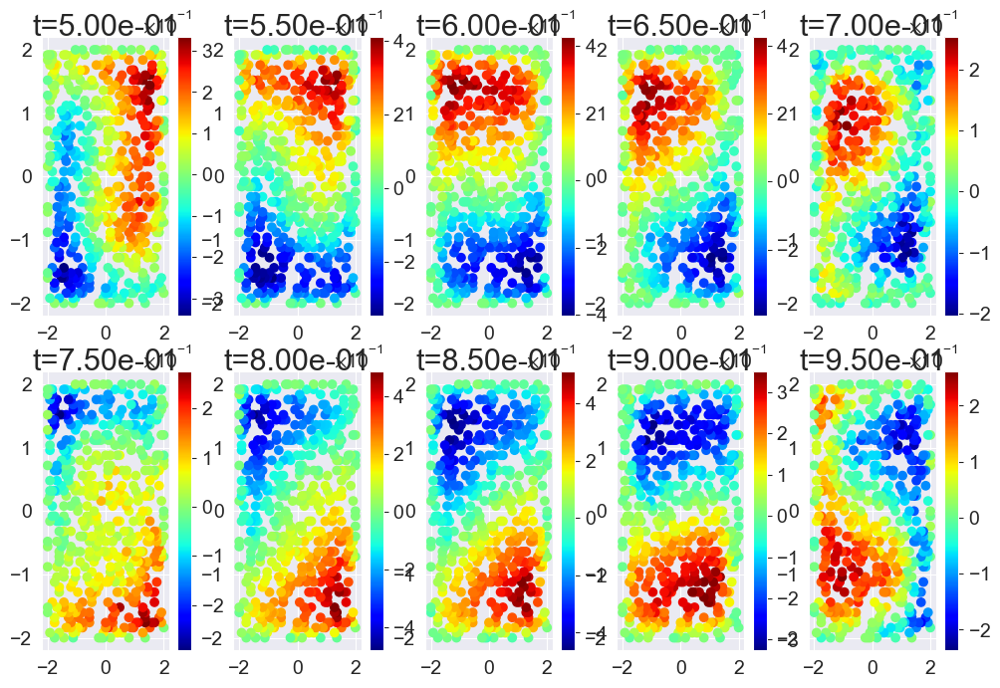

In [17]:
hm.plot_obs_state(idxs=range(10))

In [18]:
hm.save('hm_2_its.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [19]:
best = prob.probs[-1].best

In [24]:
pd.concat(best.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,0.944799,2.101473,1.0,0.82,True,None,2.489202,0.455644,-0.446218,0.718686,...,0.24253,-0.184956,0.715508,-0.734357,-0.195928,45,"[0, 1]","range(0, 5500)",1,1


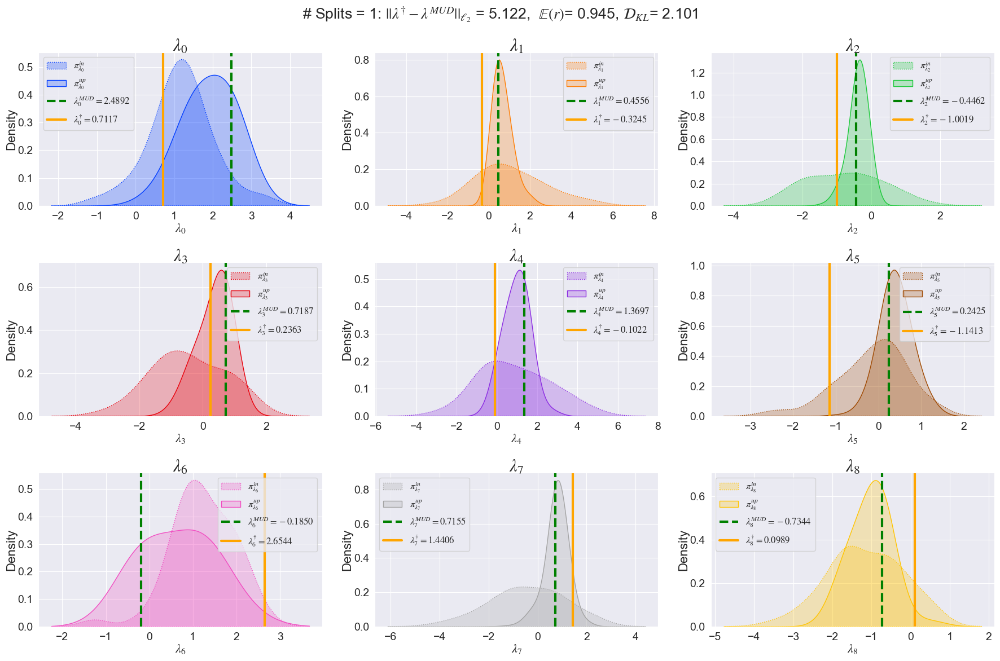

In [21]:
best.param_density_plots(lam_true=hm.lam_true)

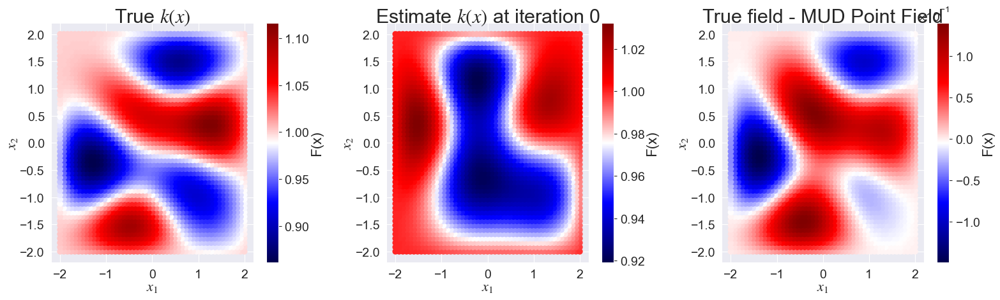

In [25]:
for i in range(len(best.results)):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = best.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$ at iteration {i}")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("True field - MUD Point Field")

    fig.tight_layout()

## Third Iteration

# Full Sim

In [4]:
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential')
prob = OnlineSequential(
    hm, # Use this to not use saved seed and start fresh - HeatModel(**heat_model_args),
    time_step=0.5,
)
prob.solve(
    num_its=6,
    max_t=None,
    num_samples=100,
    max_sample_size=200,
    samples_inc=50,
    time_step=0.5,
    exp_thresh=0.2,
    kl_thresh=3.0,
    min_eff_sample_size=0.9,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 2.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
    seed=21, # Make sure different than seed set at beginning of notebook
)
prob.probs[-1].results

[08/16/23 18:46:02] INFO     Setting seed to 21                                             ]8;id=717207;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=28757;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#605\605]8;;\

                    INFO     No previous data -> Starting from initial                      ]8;id=273771;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=449978;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#610\610]8;;\

                    DEBUG    make_plots: False                                              ]8;id=950296;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=469358;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#648\648]8;;\

                    INFO     Starting online solve with 100 samples at data chunk 0         ]8;id=316756;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=552072;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#653\653]8;;\

                    DEBUG    Getting measurements over time window 0 to 0.5                 ]8;id=577931;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=237686;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 18:46:09] DEBUG    Starting solves for iteration 0                                ]8;id=454593;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=399527;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=381682;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=827485;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Starting from initial Reset:False, Data_Idx: 0                 ]8;id=826544;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=947879;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#493\493]8;;\
                             Sampling Args: {'dist': 'normal', 'mean': 0.0, 'std_dev': 2.0}                        
                             Solver Args: {'pca_range': range(1, 3), 'split_range':                                
                             range(1, 10), 'best_method': 'max_kl', 'all_data': True}                              

                    INFO     Advancing forward model for 100 samples                        ]8;id=769324;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=6913;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 18:56:03] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=814204;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=295750;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True}                                                                     

[08/16/23 18:56:15] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=258084;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=868176;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  1.058571  1.819975   1.00      0.65    True                                        
                             0  0.741669  2.787553   1.00      0.81   False                                        
                             0  1.067550  0.254806   0.72      0.68    True                                        
                             0  1.086870  0.178547   0.76      0.74    True                                        
                             0  0.407932  1.515412   0.60      0.57   False                                        
                             0  0.743551  1.387061   1.00      0.96   False                                        
                             0  0.323549  6.303217   0.73      0.81   False                                        
                             0  1.038419  0.098608   0.94      0.91    True                                        
                             0  0.606441  1.080044   1.00      1.00   False                                        
                             0  0.531540  2.930697   1.00      0.49   False                                        
                             0  0.133885  3.582062   0.74      0.54   False                                        
                             0  0.581499  2.833744   1.00      0.89   False                                        
                             0  1.423419  1.466361   1.00      0.78   False                                        
                             0  0.738368  1.008217   1.00      1.00   False                                        
                             0  0.569833  1.514981   1.00      0.93   False                                        
                             0  0.740042  0.635037   0.83      0.71   False                                        
                             0  0.726745  1.280002   1.00      1.00   False                                        
                             0  0.668618  1.608837   1.00      1.00   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             -1.257815   1.293018                                                                  
                             0  Failed to solve problem on iteration 1 - |E(r)...                                  
                             -1.257815   1.293018                                                                  
                             0                                               None                                  
                             0.520605   2.861975                                                                   
                             0                                               None                                  
                             0.520605   2.861975                                                                   
                             0  Failed to solve problem on iteration 5 - |E(r)...                                  
                             0.538543   0.872553                                

                    DEBUG    Getting measurements over time window 0.5 to 1.0               ]8;id=831878;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=765825;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 18:56:20] DEBUG    Starting solves for iteration 1                                ]8;id=484909;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=477488;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=722575;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=20400;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.65 < 0.9).                               ]8;id=703551;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=306545;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_0                                       ]8;id=608980;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=437558;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

[08/16/23 18:56:21] INFO     Advancing forward model for 100 samples                        ]8;id=563289;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=609827;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 19:06:08] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=85871;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=569659;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True, 'search_exp_thresh': 0.2}                                           

[08/16/23 19:06:20] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=130533;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=169605;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  1.014154  1.329658   1.00      0.67    True                                        
                             0  1.014223  0.174058   0.85      0.73    True                                        
                             0  0.974191  0.094523   0.83      0.77    True                                        
                             0  0.959729  0.124795   0.79      0.74    True                                        
                             0  0.970579  0.153360   0.76      0.76    True                                        
                             0  0.904610  0.110001   0.89      0.92    True                                        
                             0  0.716996  1.031461   0.79      0.88   False                                        
                             0  0.746552  0.843954   0.94      0.91   False                                        
                             0  0.674596  0.570771   0.88      0.83   False                                        
                             0  0.320423  2.455764   1.00      0.42   False                                        
                             0  0.433758  1.925904   1.00      0.61   False                                        
                             0  0.930391  0.284081   0.62      0.52    True                                        
                             0  0.478367  3.349126   0.89      0.72   False                                        
                             0  0.622388  3.974713   0.94      0.75   False                                        
                             0  0.315693  3.351894   0.97      0.86   False                                        
                             0  0.354826  3.456031   0.97      0.87   False                                        
                             0  0.557631  1.396619   0.94      0.85   False                                        
                             0  0.293323  2.098144   0.95      0.96   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             0.422582   0.951414                                                                   
                             0                                               None                                  
                             0.688204   2.475781                                                                   
                             0                                               None                                  
                             0.422582   0.951414                                                                   
                             0                                               None                                  
                             0.688204   2.475781                                                                   
                             0                                               None                                  
                             0.469898   0.711372                                

                    DEBUG    Getting measurements over time window 1.0 to 1.5               ]8;id=938182;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=423000;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 19:06:26] DEBUG    Starting solves for iteration 2                                ]8;id=554402;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=251255;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=705383;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=457121;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.67 < 0.9).                               ]8;id=136396;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=487752;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_1                                       ]8;id=453133;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=854838;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

                    INFO     Advancing forward model for 100 samples                        ]8;id=486614;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=169133;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 19:15:21] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=621449;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=510533;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True, 'search_exp_thresh': 0.2}                                           

[08/16/23 19:15:28] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=960802;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=697839;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  0.966901  1.614100   1.00      0.55    True                                        
                             0  1.051228  0.081451   0.62      0.58    True                                        
                             0  1.034467  0.031948   0.65      0.63    True                                        
                             0  0.976682  0.213980   0.70      0.74    True                                        
                             0  0.907007  0.111091   0.63      0.64    True                                        
                             0  0.972849  0.006091   0.76      0.79    True                                        
                             0  0.762340  1.541948   0.77      0.72   False                                        
                             0  0.423147  2.103735   0.87      0.91   False                                        
                             0  0.646901  0.941692   0.83      0.83   False                                        
                             0  1.932175  3.197493   1.00      0.33   False                                        
                             0  0.772366  0.248920   0.50      0.42   False                                        
                             0  0.134551  1.583781   0.69      0.28   False                                        
                             0  1.737701  1.156475   0.80      0.49   False                                        
                             0  1.312077  0.824516   1.00      0.94   False                                        
                             0  0.291201  1.774433   0.77      0.47   False                                        
                             0  0.020289  3.801552   0.58      0.42   False                                        
                             0  0.771686  1.405991   0.97      0.87   False                                        
                             0  0.693229  1.478588   0.98      0.89   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             -0.835823  -0.277826                                                                  
                             0                                               None                                  
                             -0.835823  -0.277826                                                                  
                             0                                               None                                  
                             -0.139710   0.646941                                                                  
                             0                                               None                                  
                             0.634597  -2.263755                                                                   
                             0                                               None                                  
                             -0.139710   0.646941                               

                    DEBUG    Getting measurements over time window 1.5 to 2.0               ]8;id=193812;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=280048;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 19:15:34] DEBUG    Starting solves for iteration 3                                ]8;id=154623;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=133073;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=524162;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=219836;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.55 < 0.9).                               ]8;id=84438;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=321861;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_2                                       ]8;id=512520;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=276632;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

                    INFO     Advancing forward model for 100 samples                        ]8;id=736629;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=970638;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 19:24:18] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=945885;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=757411;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True, 'search_exp_thresh': 0.2}                                           

[08/16/23 19:24:28] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=425098;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=685495;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  0.959360  1.820085   1.00      0.55    True                                        
                             0  1.058912  0.185836   0.65      0.56    True                                        
                             0  0.961507  0.240334   0.65      0.60    True                                        
                             0  0.945228  0.219280   0.64      0.63    True                                        
                             0  0.592156  1.316818   0.76      0.70   False                                        
                             0  0.704874  0.707192   0.68      0.67   False                                        
                             0  0.768225  0.225661   0.63      0.63   False                                        
                             0  0.633433  1.847218   0.83      0.70   False                                        
                             0  0.777629  0.556482   0.85      0.73   False                                        
                             0  1.342547  2.763408   1.00      0.38   False                                        
                             0  1.271422  2.129647   1.00      0.56   False                                        
                             0  0.785185  0.599820   0.75      0.52   False                                        
                             0  1.253281  0.721666   1.00      0.92   False                                        
                             0  0.401935  1.888933   0.72      0.66   False                                        
                             0  0.386528  1.059822   0.65      0.71   False                                        
                             0  0.351336  2.357174   0.87      0.61   False                                        
                             0  0.723253  1.349346   1.00      0.94   False                                        
                             0  0.499110  0.481314   0.84      0.71   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             -0.022667   0.805367                                                                  
                             0                                               None                                  
                             1.632516   1.235702                                                                   
                             0                                               None                                  
                             -2.114026   2.043335                                                                  
                             0                                               None                                  
                             -2.114026   2.043335                                                                  
                             0  Failed to solve problem on iteration 3 - |E(r)...                                  
                             1.590953   1.242315                                

                    DEBUG    Getting measurements over time window 2.0 to 2.5               ]8;id=686771;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=545367;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 19:24:34] DEBUG    Starting solves for iteration 4                                ]8;id=811664;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=595892;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=995543;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=627962;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.55 < 0.9).                               ]8;id=782434;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=874810;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_3                                       ]8;id=39775;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=388757;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

                    INFO     Advancing forward model for 100 samples                        ]8;id=996948;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=936383;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 19:32:53] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=206458;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=810038;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True, 'search_exp_thresh': 0.2}                                           

[08/16/23 19:33:04] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=297776;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=828004;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  0.977209  1.207999   1.00      0.72    True                                        
                             0  0.865594  0.696403   0.83      0.82    True                                        
                             0  0.991278  0.113434   0.93      0.86    True                                        
                             0  0.991782  0.077055   0.94      0.94    True                                        
                             0  0.734553  1.412594   0.92      0.95   False                                        
                             0  0.794550  1.531468   1.00      1.00   False                                        
                             0  0.621995  2.237266   0.88      1.00   False                                        
                             0  0.780798  1.095715   0.94      0.99   False                                        
                             0  0.718065  2.181038   0.99      0.99   False                                        
                             0  1.177376  1.973926   1.00      0.60    True                                        
                             0  0.655855  1.574416   0.75      0.71   False                                        
                             0  0.891658  0.173128   0.83      0.76    True                                        
                             0  0.594968  1.570344   0.97      0.82   False                                        
                             0  0.591354  1.040775   0.92      0.93   False                                        
                             0  0.609765  2.281030   1.00      1.00   False                                        
                             0  0.536250  1.650772   0.85      0.98   False                                        
                             0  0.663717  0.824419   0.94      0.97   False                                        
                             0  0.725168  2.209457   0.99      1.00   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             0.603641  -0.383427                                                                   
                             0                                               None                                  
                             2.611743  -1.120766                                                                   
                             0                                               None                                  
                             1.317255   1.344494                                                                   
                             0                                               None                                  
                             2.611743  -1.120766                                                                   
                             0  Failed to solve problem on iteration 3 - |E(r)...                                  
                             0.603641  -0.383427                                

                    DEBUG    Getting measurements over time window 2.5 to 3.0               ]8;id=595959;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=498643;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

[08/16/23 19:33:10] DEBUG    Starting solves for iteration 5                                ]8;id=148659;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=748954;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=151155;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=338740;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Re-setting weights: 0.6 < 0.9).                                ]8;id=615832;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=125706;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#472\472]8;;\

                    INFO     Re-sampling from pi_up_4                                       ]8;id=76195;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=548250;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#475\475]8;;\

                    INFO     Advancing forward model for 100 samples                        ]8;id=66048;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=9062;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 19:41:48] DEBUG    Solving UN-WEIGHTED 100 samples. Args: {'pca_range': range(1,  ]8;id=891322;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=6598;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True, 'search_exp_thresh': 0.2}                                           

[08/16/23 19:42:16] INFO     Solved SUCCEEDED (s = 100). Results:                           ]8;id=31714;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=259870;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  1.110000  0.641608   1.00      0.89    True                                        
                             0  0.986743  0.225253   0.93      0.93    True                                        
                             0  0.833727  0.752342   0.98      0.95    True                                        
                             0  0.173332  4.317402   0.95      0.97   False                                        
                             0  0.824759  0.987812   0.99      1.00    True                                        
                             0  0.313903  2.882481   0.98      0.98   False                                        
                             0  0.718489  2.401510   1.00      0.98   False                                        
                             0  0.495187  1.854092   1.00      1.00   False                                        
                             0  0.744412  1.214897   1.00      1.00   False                                        
                             0  1.278753  1.116116   1.00      0.83   False                                        
                             0  0.319592  2.559123   0.93      0.89   False                                        
                             0  0.477092  1.453623   0.98      0.94   False                                        
                             0  0.646552  1.998309   1.00      0.94   False                                        
                             0  0.636973  0.813151   1.00      0.99   False                                        
                             0  0.187036  3.450180   0.99      0.99   False                                        
                             0  0.473630  2.759148   1.00      0.97   False                                        
                             0  0.688088  2.317976   1.00      1.00   False                                        
                             0  0.704668  1.523764   1.00      1.00   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             0.920291   0.368404                                                                   
                             0                                               None                                  
                             1.456284  -1.147173                                                                   
                             0                                               None                                  
                             0.920291   0.368404                                                                   
                             0  Failed to solve problem on iteration 3 - |E(r)...                                  
                             0.116514  -0.845446                                                                   
                             0                                               None                                  
                             0.022866  -0.917750                                 

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.110000,0.641608,1.00,0.89,True,None,0.920291,0.368404,-0.530395,0.934267,...,1,0,0.110000,True,True,False,False,False,100,False
0,0.986743,0.225253,0.93,0.93,True,None,1.456284,-1.147173,-0.704970,0.399875,...,2,1,0.013257,True,True,True,False,True,100,False
0,0.833727,0.752342,0.98,0.95,True,None,0.920291,0.368404,-0.530395,0.934267,...,3,2,0.166273,True,True,False,False,False,100,False
0,0.173332,4.317402,0.95,0.97,False,Failed to solve problem on iteration 3 - |E(r)...,0.116514,-0.845446,-0.942298,0.244821,...,4,3,0.826668,False,False,False,False,False,100,False
0,0.824759,0.987812,0.99,1.00,True,None,0.022866,-0.917750,-0.073025,0.780977,...,5,4,0.175241,True,True,False,True,False,100,False
0,0.313903,2.882481,0.98,0.98,False,Failed to solve problem on iteration 4 - |E(r)...,0.116514,-0.845446,-0.942298,0.244821,...,6,5,0.686097,False,False,False,False,False,100,False
0,0.718489,2.401510,1.00,0.98,False,Failed to solve problem on iteration 3 - |E(r)...,0.624944,0.011813,-0.698808,1.489576,...,7,6,0.281511,True,False,False,False,False,100,False
0,0.495187,1.854092,1.00,1.00,False,Failed to solve problem on iteration 5 - |E(r)...,0.096531,1.503712,-1.232613,1.449222,...,8,7,0.504813,False,False,False,False,False,100,False
0,0.744412,1.214897,1.00,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,0.624944,0.011813,-0.698808,1.489576,...,9,8,0.255588,True,False,False,False,False,100,False
0,1.278753,1.116116,1.00,0.83,False,Failed to solve problem on iteration 1 - |E(r)...,1.456284,-1.147173,-0.704970,0.399875,...,1,9,0.278753,True,False,False,False,False,100,False


(None, <Axes: xlabel='Iteration', ylabel='$\\mathrm{KL}()$'>)

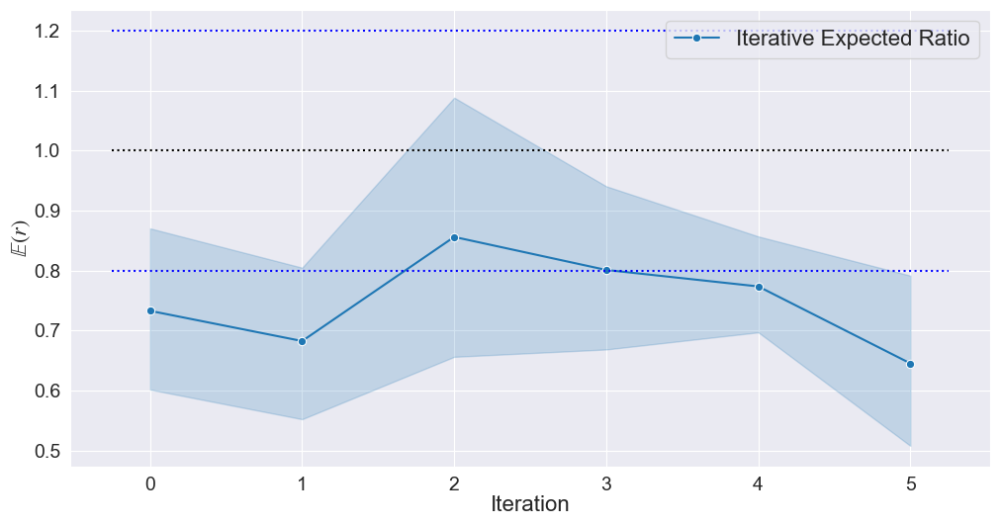

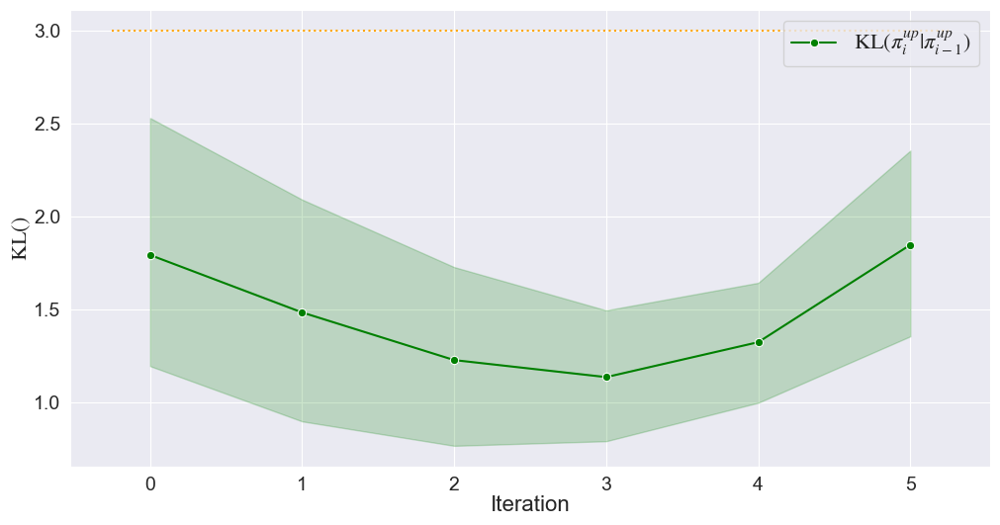

In [18]:
full_prob.e_r_plot(e_r_thresh=0.2), full_prob.kl_plot(kl_thresh=3.0)

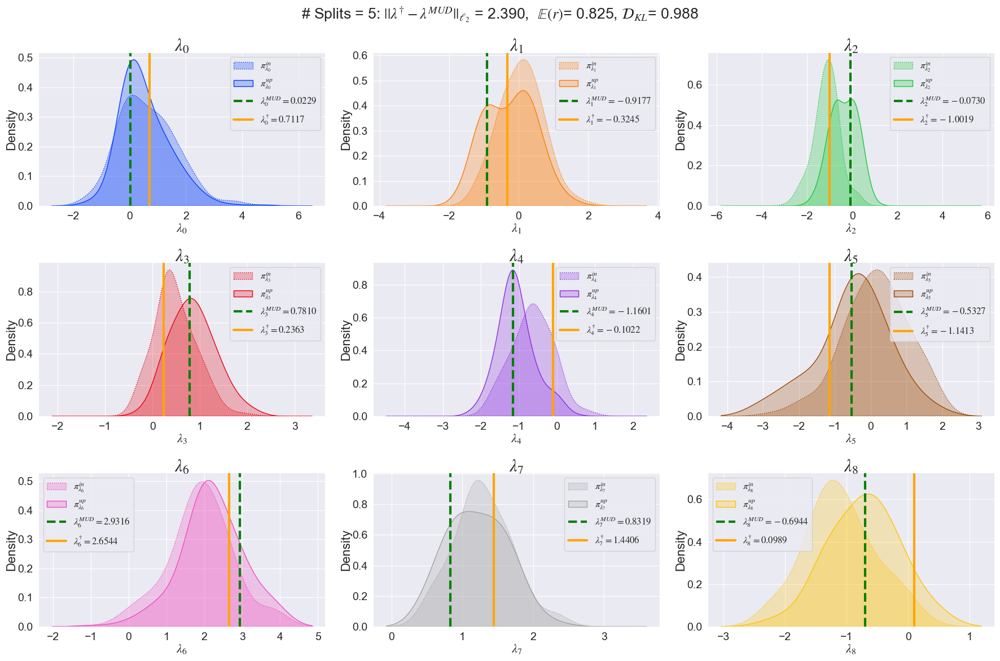

In [13]:
full_prob.best.param_density_plots(lam_true=hm.lam_true)

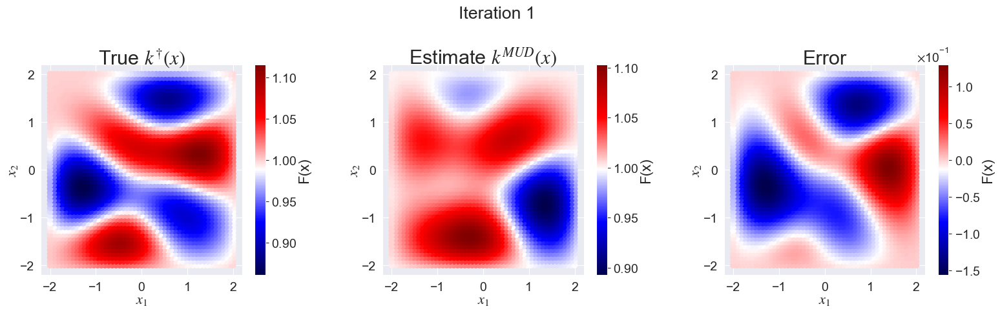

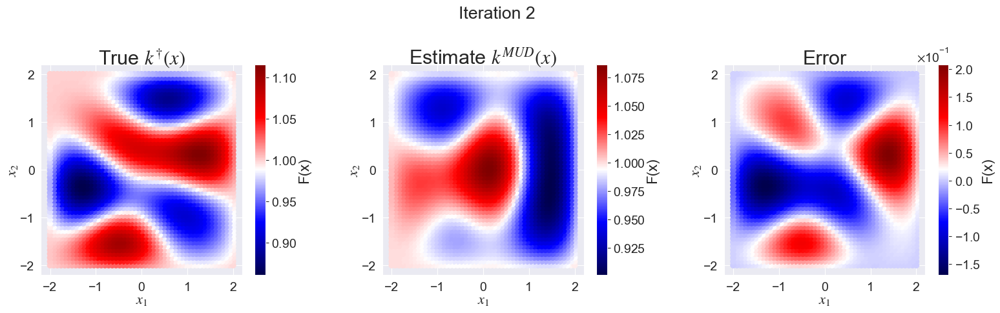

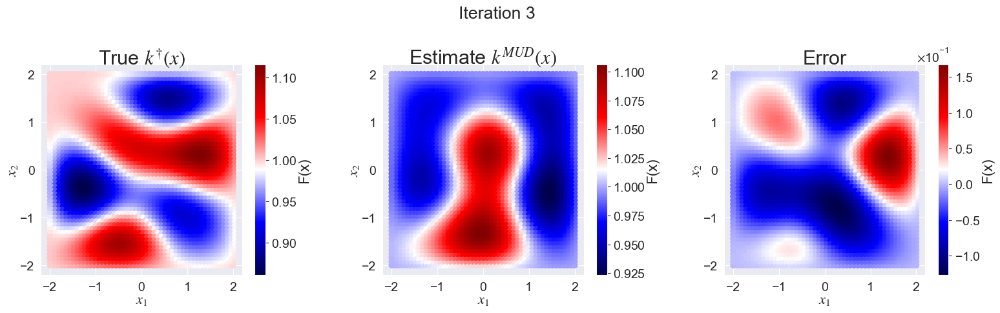

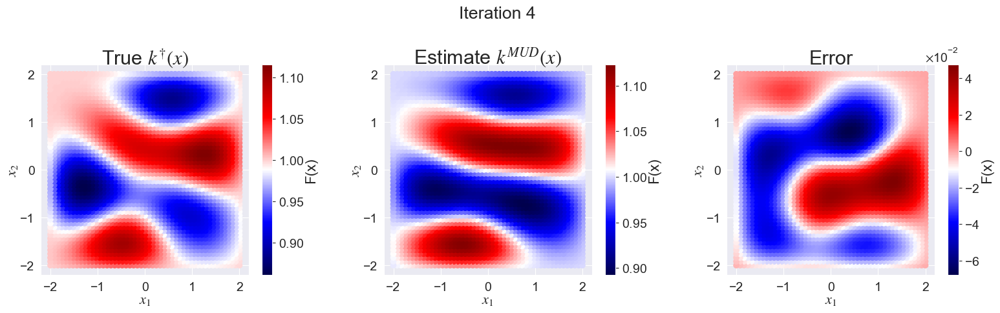

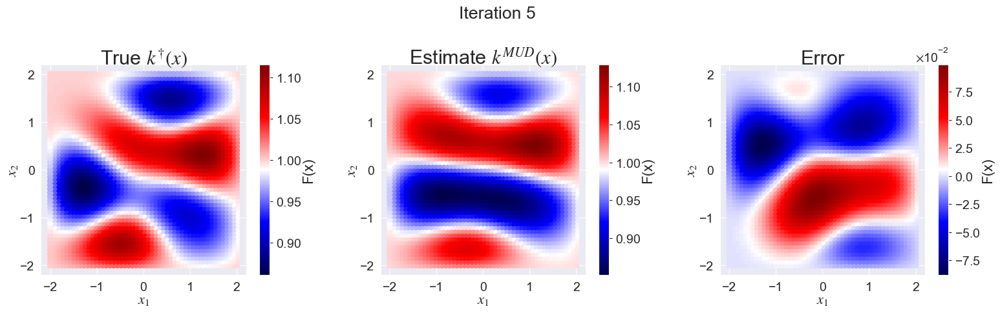

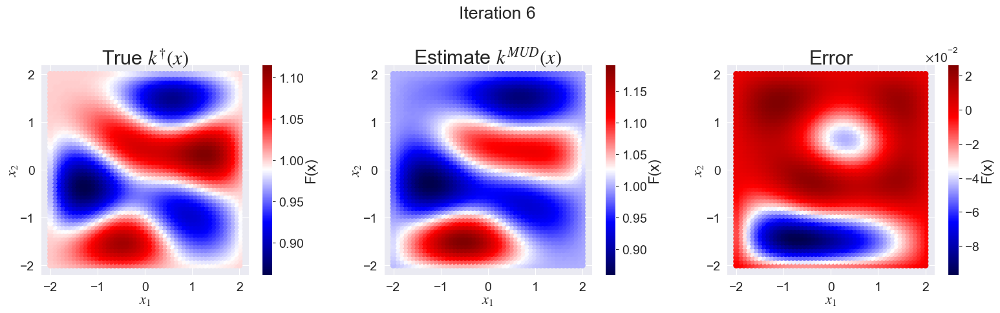

In [17]:
for i, p in enumerate(full_prob.probs):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = p.best.get_mud_point()[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k^{\dagger}(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title("Estimate $k^{MUD}(x)$")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("Error")

    fig.suptitle(f'Iteration {i + 1}')

    fig.tight_layout()

In [24]:
full_prob.model.samples[0][full_prob.model.samples[0]['best_flag']]

,lam_0,lam_1,lam_2,lam_3,lam_4,lam_5,lam_6,lam_7,lam_8,lam_9,...,q_lam_5491,q_lam_5492,q_lam_5493,q_lam_5494,q_lam_5495,q_lam_5496,q_lam_5497,q_lam_5498,q_lam_5499,best_flag
81,-1.257815,1.293018,0.560762,1.706771,-1.014048,-0.095044,0.11079,1.293845,-1.1824,-1.074604,...,0.114592,0.0,0.131072,0.100131,0.141491,0.108563,0.0,0.080228,0.0,True


In [26]:
test = full_prob.model.samples[0].copy()
test

,lam_0,lam_1,lam_2,lam_3,lam_4,lam_5,lam_6,lam_7,lam_8,lam_9,...,q_lam_5491,q_lam_5492,q_lam_5493,q_lam_5494,q_lam_5495,q_lam_5496,q_lam_5497,q_lam_5498,q_lam_5499,best_flag
0,0.902777,0.980490,1.600040,-1.830969,0.905675,-2.043585,-0.850246,1.455357,0.260101,-1.082954,...,0.114064,0.0,0.130796,0.100154,0.141553,0.108650,0.0,0.080298,0.0,False
1,-0.118708,-0.092447,0.693102,-0.288900,-0.056751,0.784476,-1.042492,0.110872,-0.012422,-0.726591,...,0.113375,0.0,0.130336,0.100071,0.141460,0.108635,0.0,0.080306,0.0,False
2,-1.294691,0.000800,-2.394093,-0.440840,-0.237559,0.104299,-0.090466,-1.356193,0.605829,0.617137,...,0.114262,0.0,0.130941,0.100255,0.141666,0.108710,0.0,0.080341,0.0,False
3,-0.224987,-0.318096,-0.114412,1.292431,0.792476,1.848870,-0.956733,1.939115,0.209058,-0.523991,...,0.114321,0.0,0.130823,0.099996,0.141283,0.108427,0.0,0.080148,0.0,False
4,-0.805359,1.672560,-1.928774,1.836009,-0.334832,0.976135,0.574535,2.736033,-3.332697,-0.728043,...,0.117139,0.0,0.132480,0.100067,0.141253,0.108189,0.0,0.079918,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.601078,-0.141784,0.716093,0.774008,0.065617,-2.722048,1.699861,-1.510429,3.101089,1.088682,...,0.111612,0.0,0.129273,0.100054,0.141466,0.108758,0.0,0.080442,0.0,False
96,0.163415,-3.468685,-0.071683,3.498933,0.826466,-0.800340,0.764395,0.352711,-0.896988,-1.423302,...,0.109304,0.0,0.127831,0.099757,0.141223,0.108777,0.0,0.080485,0.0,False
97,-0.564534,-1.643817,-1.993708,-1.581846,1.368082,0.193401,0.073284,-2.233457,1.246827,3.466881,...,0.114178,0.0,0.130735,0.100051,0.141318,0.108448,0.0,0.080177,0.0,False
98,-0.776160,1.469089,-0.504098,-0.379016,-0.710480,0.980573,0.200408,1.678354,-0.754790,1.595896,...,0.117373,0.0,0.132536,0.100012,0.141086,0.108032,0.0,0.079823,0.0,False


In [43]:
prob.probs[0].probs[3].states

,lam_0,lam_1,lam_2,lam_3,lam_4,lam_5,lam_6,lam_7,lam_8,lam_9,...,q_pca_9,weight,pi_in,pi_obs,pi_pr,ratio,weighted_ratio,pi_up,pred_assumption,iteration
0,0.902777,0.980490,1.600040,-1.830969,0.905675,-2.043585,-0.850246,1.455357,0.260101,-1.082954,...,0.079005,1.000000e+00,4.825169e-08,0.003772,0.209498,0.018004,1.800365e-02,8.687065e-10,True,1
1,-0.118708,-0.092447,0.693102,-0.288900,-0.056751,0.784476,-1.042492,0.110872,-0.012422,-0.726591,...,0.403890,1.000000e+00,1.571952e-06,0.029823,0.215851,0.138165,1.381653e-01,2.171892e-07,True,1
2,-1.294691,0.000800,-2.394093,-0.440840,-0.237559,0.104299,-0.090466,-1.356193,0.605829,0.617137,...,2.814822,1.000000e+00,2.451627e-07,0.000006,0.081551,0.000074,7.404433e-05,1.815291e-11,True,1
3,-0.224987,-0.318096,-0.114412,1.292431,0.792476,1.848870,-0.956733,1.939115,0.209058,-0.523991,...,0.203021,1.000000e+00,2.104604e-07,0.000438,0.161945,0.002705,2.704863e-03,5.692665e-10,True,1
4,-0.805359,1.672560,-1.928774,1.836009,-0.334832,0.976135,0.574535,2.736033,-3.332697,-0.728043,...,1.395305,1.000000e+00,1.355807e-09,0.359219,0.122950,2.921668,2.921668e+00,3.961216e-09,True,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.601078,-0.141784,0.716093,0.774008,0.065617,-2.722048,1.699861,-1.510429,3.101089,1.088682,...,-0.215181,3.533737e-16,7.438190e-18,0.389230,0.191565,2.031838,7.179982e-16,5.340607e-33,True,4
96,0.163415,-3.468685,-0.071683,3.498933,0.826466,-0.800340,0.764395,0.352711,-0.896988,-1.423302,...,-2.681794,1.347223e-04,2.542468e-09,0.398092,0.201999,1.970765,2.655060e-04,6.750405e-13,True,4
97,-0.564534,-1.643817,-1.993708,-1.581846,1.368082,0.193401,0.073284,-2.233457,1.246827,3.466881,...,-3.404932,4.191203e-29,1.711087e-26,0.000715,0.011436,0.062554,2.621771e-30,4.486077e-56,True,4
98,-0.776160,1.469089,-0.504098,-0.379016,-0.710480,0.980573,0.200408,1.678354,-0.754790,1.595896,...,-0.826477,7.690088e-04,1.471606e-08,0.031278,0.042105,0.742859,5.712648e-04,8.406770e-12,True,4


In [32]:
test_state = prob.best.state.copy()

def append_solution_to_state(self, data_idx=-1, save_searches=True, save_iterations=True):
    """
    Append 
    """


In [38]:
import pandas as pd
pd.merge(test, prob.best.state.copy().add_suffix('_best_1'), left_index=True, right_index=True, how='inner', suffixes=['', '_best_1'])

,lam_0,lam_1,lam_2,lam_3,lam_4,lam_5,lam_6,lam_7,lam_8,lam_9,...,q_pca_2_best_1,q_pca_3_best_1,q_pca_4_best_1,q_pca_5_best_1,q_pca_6_best_1,q_pca_7_best_1,q_pca_8_best_1,q_pca_9_best_1,weighted_ratio_best_1,pred_assumption_best_1
0,0.902777,0.980490,1.600040,-1.830969,0.905675,-2.043585,-0.850246,1.455357,0.260101,-1.082954,...,-3.191516,-1.517123,0.707671,0.413021,-0.285959,-0.218458,-1.428139,-1.896823,2.723456e-01,True
1,-0.118708,-0.092447,0.693102,-0.288900,-0.056751,0.784476,-1.042492,0.110872,-0.012422,-0.726591,...,-2.818003,-1.009673,0.443228,0.923450,-0.793370,-0.285339,-1.252728,-1.905449,1.167718e+00,True
2,-1.294691,0.000800,-2.394093,-0.440840,-0.237559,0.104299,-0.090466,-1.356193,0.605829,0.617137,...,-2.698998,-0.928764,1.518068,0.872824,-0.388025,-0.141088,-1.764857,-1.632427,2.402932e-03,True
3,-0.224987,-0.318096,-0.114412,1.292431,0.792476,1.848870,-0.956733,1.939115,0.209058,-0.523991,...,-1.155999,-1.833718,0.281501,0.217183,0.092504,0.250364,-1.433549,-1.442874,6.277444e-01,True
4,-0.805359,1.672560,-1.928774,1.836009,-0.334832,0.976135,0.574535,2.736033,-3.332697,-0.728043,...,-1.433049,-1.577829,1.394503,1.319548,-0.566789,-0.017584,-1.138854,-1.304398,1.192659e-02,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.601078,-0.141784,0.716093,0.774008,0.065617,-2.722048,1.699861,-1.510429,3.101089,1.088682,...,-2.206340,-1.621283,0.892810,0.442009,-0.105919,-0.231037,-1.560269,-1.761443,2.879962e-02,True
96,0.163415,-3.468685,-0.071683,3.498933,0.826466,-0.800340,0.764395,0.352711,-0.896988,-1.423302,...,-2.141067,-0.649609,0.807809,0.640410,-0.886560,-0.115590,-1.177247,-1.764347,1.882562e+00,True
97,-0.564534,-1.643817,-1.993708,-1.581846,1.368082,0.193401,0.073284,-2.233457,1.246827,3.466881,...,-1.780390,-0.411682,0.943198,0.844536,0.039050,0.163639,-1.607334,-2.052421,3.219621e-07,True
98,-0.776160,1.469089,-0.504098,-0.379016,-0.710480,0.980573,0.200408,1.678354,-0.754790,1.595896,...,-2.570849,-1.531266,1.191212,0.925801,-0.264099,-0.170316,-1.630046,-1.776181,1.007438e+00,True


In [25]:
full_prob.model.save('hm_10-iterations_100-samples.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



# Old results

In [ ]:
hm2.get_data(1.0)

In [ ]:
num_samples = 100
samples_1 = prob.sample_dist(num_samples=num_samples)
pi_up_1 = prob.dists["pi_up"]
samples_1.shape

(100, 4)

In [ ]:
disable_log()
hm2.forward_solve(samples_1, restart=True)

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.11259528, -0.17947601, -0.15307315, ...,  0.06837078,
          0.01200697, -0.11790626],
        [ 0.05210833,  0.07083338,  0.01031819, ..., -0.05684411,
         -0.05919235, -0.10119049],
        [ 0.18342016,  0.24107654,  0.2087223 , ..., -0.215004  ,
          0.01506741,  0.07306923],
        ...,
        [-0.15647908, -0.22096363, -0.28701788, ...,  0.26512085,
          0.05967818, -0.04785114],
        [-0.11123512, -0.10704408, -0.13067355, ...,  0.17179913,
         -0.05096112, -0.01301608],
        [-0.06873262, -0.07762806, -0.1615912 , ...,  0.18042091,
         -0.02719195,  0.01954276]]),
 (11, 500))

In [ ]:
disable_log()
prob = OfflineSequential(
    hm2.samples[1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve(pca_components=[[0, 1]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits
0,0.8233,0.562814,0.290852,0.961946,-0.137489,-1.688744,3,"[0, 1]",10


In [ ]:
prob.mud_point, hm2.lam_true

(array([ 0.29085227,  0.96194567, -0.13748922, -1.68874395]),
 array([-1.0856306 ,  0.99734545,  0.2829785 , -1.50629471]))

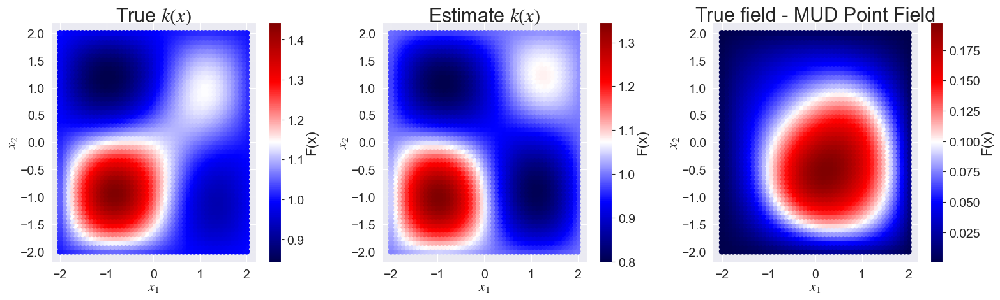

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

## Online sequential solve

In [ ]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from pydci import PCAMUDProblem
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

set_seed(123)


class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            6 * np.sin(2 * np.pi * self.t) * x[0]
            + 2 * np.cos(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=4,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[08/02/23 13:55:37] INFO     Logger initialized                                                           ]8;id=295600;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=666177;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=321777;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=90567;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[08/02/23 13:55:53] DEBUG    State idxs set at: None                                                    ]8;id=930142;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=700109;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#90\90]8;;\

In [ ]:
import importlib
import pydci.consistent_bayes.OnlineSequential as os

importlib.reload(os)
prob = os.OnlineSequential(
    hm,
    def_init="normal",
)

In [ ]:
enable_log(level="INFO")
# prob.solve(
#     max_t=1,
#     num_samples=10,
#     time_step=1,
#     exp_thresh=0.5,
#     kl_thresh=4.5,
#     comb_args={
#         'max_nc': 2,
#         'exp_thresh': 1e10,
#         'split_range': [1, 2],
#     },
#     search_args={
#         'exp_thresh': 1e10,
#         'best_method': 'closest',
#     },
#     sampling_args={
#         'mean': 1.0,
#         'std_dev': 1.0,
#     }
# )

[08/02/23 15:26:12] INFO     Logger initialized                                                           ]8;id=296118;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=503838;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

<loguru.logger handlers=[(id=3, level=20, sink=<RichHandler (NOTSET)>)]>

## Iterative Breakdwon

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.0503295 ,  0.04333017,  0.01859238, ..., -0.09026164,
          0.01672525, -0.03757275],
        [ 0.11129165,  0.02183807,  0.05497946, ..., -0.08927662,
         -0.03069886, -0.09858796],
        [ 0.36503246,  0.20933543,  0.30617139, ..., -0.3867091 ,
          0.03155849, -0.25270547],
        ...,
        [-0.49835249, -0.36362105, -0.50400411, ...,  0.50715134,
         -0.00785971,  0.24784683],
        [-0.27162777, -0.18832302, -0.31768101, ...,  0.3602917 ,
          0.06235934,  0.14456361],
        [-0.13244838, -0.03995926, -0.14832467, ...,  0.15198369,
         -0.05855545, -0.00311293]]),
 (11, 500))

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm2.samples[-1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,2.792011,2.155546,0.935686,0.21199,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
prob.mud_point

array([ 0.93568636,  0.21198978, -0.22577909, -0.40577332])

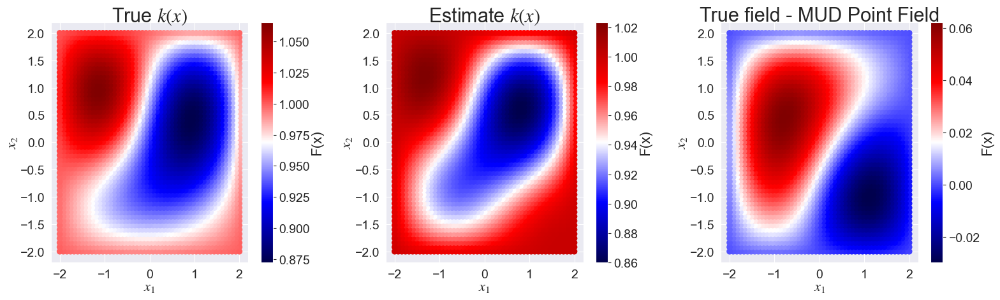

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

In [ ]:
prob.it_results

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,0.941807,0.423399,0.712320,0.342105,0.693094,0.891946,58,[0],"range(0, 550)",0
0,0.998670,0.012344,0.931816,0.294412,1.280604,2.716632,34,[0],"range(550, 1100)",1
0,0.987230,0.770167,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1100, 1650)",2
0,1.078473,0.738110,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1650, 2200)",3
0,0.817274,1.924596,0.086046,1.180829,-0.047040,-0.752936,35,[0],"range(2200, 2750)",4
0,0.311481,2.489514,0.712320,0.342105,0.693094,0.891946,58,[0],"range(2750, 3300)",5
0,1.444133,0.912239,0.869742,-0.148870,1.411826,1.559119,42,[0],"range(3300, 3850)",6
0,0.492424,1.112835,0.712320,0.342105,0.693094,0.891946,58,[0],"range(3850, 4400)",7
0,0.131915,3.530549,0.712320,0.342105,0.693094,0.891946,58,[0],"range(4400, 4950)",8
0,2.792011,2.155546,0.935686,0.211990,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
its

array([0, 2, 4, 6, 8])

In [ ]:
hm2.lam_true

array([ 0.64766395,  0.23596671, -0.56365636, -0.32909588])

In [ ]:
import seaborn as sns

type(sns.color_palette())

seaborn.palettes._ColorPalette

In [ ]:
import seaborn as sns
import itertools
from itertools import cycle


def plot_iterations(
    self,
    param_idx=0,
    iterations=None,
    lam_true=None,
    shade=True,
    color=None,
    linestyle=None,
    ax=None,
):
    """
    Plot PCA iterations.

    Plots the initial distribution, the iterative updates, and the final solution
    as stored in the self.it_results and self.pca_states attributes of the
    PCAMUDselflem object, which are updated during a PCAMUDselflem.solve_it() call.
    The iterative updates correspond to using a re-weighted sequential data-consistent
    update, also known as "offline" sequential estimation, since iterations
    are performed on a static set of data/simulations.

    Parameters
    ----------
    param_idx : int
        Index of the parameter to plot.
    iterations : list of int
        List of iterations to plot. If None, iterations are not plotted, just initial and final.
    lam_true : list of float
        True value of the parameter. Plotted as vertical orange line. If None, no true value is plotted.
    shade : bool
        If True, the iterative updates will be plotted with increasing transparancy as the iteration number
        increases. Otherwise all plotted with the same transparancy (alpha).
    color : str
        Color to use for all lines. If None, a color palette is used, so all lines are different colors.
    linestyle : str
        Linestyle to use for all lines. If None, linestyles are cycled through ['--','-.'] for the
        iterative updates. Initial is always plotted with ':' and final with '-'.
    ax :
        Matplotlib axes object to use. If None, a new figure and axes are created.

    Results
    -------
    ax : matplotlib.axes.Axes
        The matplotlib axes object used.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))

    # Plot initial distribution
    _, labels = self.plot_L(
        param_idx=param_idx,
        iteration=0,
        initial_kwargs={
            "color": "black",
            "linestyle": ":",
            "label": "$\pi^\mathrm{init}$",
        },
        update_kwargs=None,
        mud_kwargs=None,
        lam_true=None,
        ax=ax,
    )

    if isinstance(color, str):
        colors = [color] * (len(iterations) + 1)
    else:
        colors = sns.color_palette(None, len(iterations) + 1)

    # Plot iterative updates, for each iteration specified
    if iterations is not None:
        ls = ["--", "-."]
        ls = [linestyle] * (len(iterations) + 1) if linestyle is not None else ls
        linecycler = cycle(ls)

        alphas = np.ones(len(its)) if not shade else np.linspace(0.1, 0.9, len(its))
        line_opts = {"fill": False}
        for i, it in enumerate(iterations):
            line_opts["alpha"] = alphas[i]
            line_opts["label"] = f"$\pi^\mathrm{{up}}_{{i}}$"
            line_opts["color"] = colors[i]
            line_opts["linestyle"] = next(linecycler)
            _, l = self.plot_L(
                param_idx=param_idx,
                iteration=it,
                initial_kwargs=None,
                update_kwargs=line_opts,
                mud_kwargs=None,
                lam_true=None,
                ax=ax,
            )
            labels += l

    # Plot final solution, with mud argument and true lambda
    line_opts = {"fill": True}
    line_opts["label"] = f"$\pi^\mathrm{{up}}$"
    line_opts["linestyle"] = "-"
    line_opts["color"] = colors[-1]
    mud_args = {"alpha": 1.0, "linestyle": "--", "label": "$\lambda^\mathrm{MUD}$"}
    # if 'color' in kwargs.keys():
    #     mud_args['color'] = kwargs['color']
    _, l = self.plot_L(
        param_idx=param_idx,
        iteration=len(self.it_results) - 1,
        initial_kwargs=None,
        update_kwargs=line_opts,
        mud_kwargs=mud_args,
        lam_true=lam_true,
        ax=ax,
    )
    labels += l
    ax.legend(labels=labels, loc="upper right", fontsize=14)

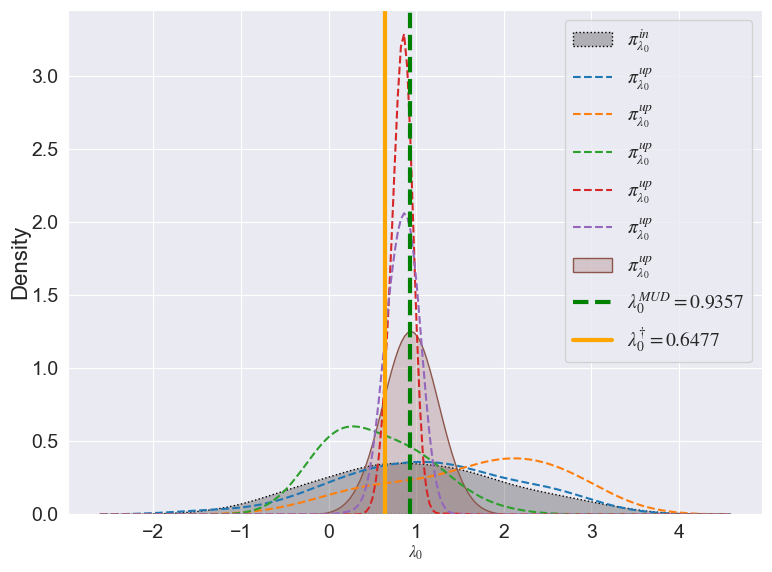

In [ ]:
plot_iterations(
    prob,
    param_idx=0,
    iterations=np.arange(0, len(prob.it_results) - 1, 2),
    lam_true=[hm2.lam_true],
    shade=False,
    linestyle="--",
)

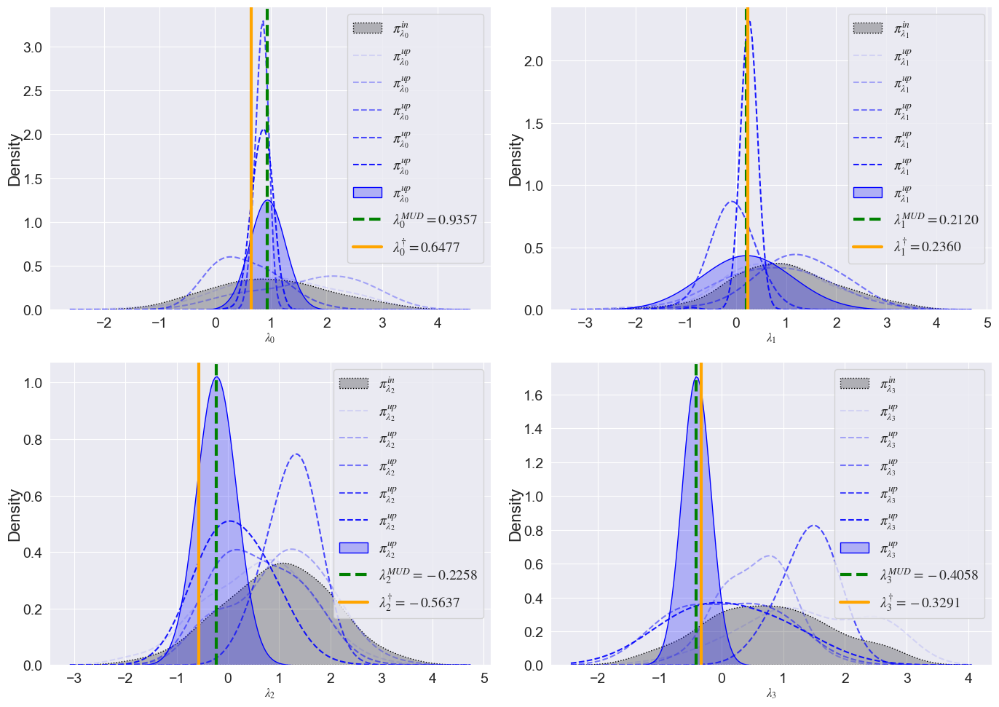

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

for i, ax in enumerate(axs.flatten()):
    plot_iterations(
        prob,
        param_idx=i,
        iterations=np.arange(0, len(prob.it_results) - 1, 2),
        lam_true=[hm2.lam_true],
        shade=True,
        color="blue",
        linestyle="--",
        ax=ax,
    )

# Parameter Estimation Problem - 10 Dimensional

In [ ]:
class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            np.sin(2 * np.pi * self.t) * x[0] + 2 * np.sin(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm_3 = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=10,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[07/31/23 17:43:33] INFO     Logger initialized                                                           ]8;id=516533;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=500812;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=294346;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=862889;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[07/31/23 17:43:40] DEBUG    State idxs set at: None                                                    ]8;id=737501;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=274871;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#89\89]8;;\

In [ ]:
hm_3.lam_true

array([-0.64644406, -0.01549523, -0.37668279,  2.06648842, -0.78282961,
       -0.52980457,  0.01711592, -0.85698592, -1.64393602, -0.63882098])

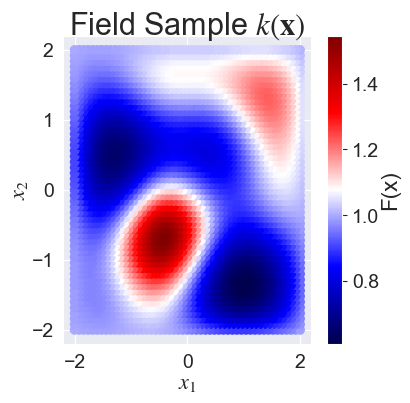

In [ ]:
hm_3.plot_field()

In [ ]:
hm_3.get_data(1.0)

KeyboardInterrupt: 

In [ ]:
from pydci.log import logger
from scipy.stats import multivariate_normal, uniform


def get_gaussian_initial_samples(self, mean=1.0, std_dev=1.0, num_samples=10):
    """
    Generate initial samples from uniform distribution over domain set by
    `self.set_domain`.
    """
    # Draw from n-dimensional Gaussian centered at `mean` with `std_dev` variance
    # Dimension equal to dimension of `self.n_params`
    logger.info(
        f"Drawing {num_samples} from multivariate normal at:\n"
        + f"\tmean: {mean}\n\tstd_dev: {std_dev}"
    )
    mean = np.ones(self.n_params) * mean if isinstance(mean, (int, float)) else mean
    std_dev = (
        np.ones(self.n_params) * std_dev
        if isinstance(std_dev, (int, float))
        else std_dev
    )
    pi_in = multivariate_normal(mean=mean, cov=std_dev)
    samples = pi_in.rvs(size=num_samples)
    return pi_in, samples

In [ ]:
num_samples = 500
pi_in, samples = get_gaussian_initial_samples(hm_3, num_samples=num_samples)
samples.shape

[07/31/23 18:02:48] INFO     Drawing 500 from multivariate normal at:                              ]8;id=358995;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py\3351901359.py]8;;\:]8;id=20328;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py#16\16]8;;\
                                     mean: 1.0                                                                     
                                     std_dev: 1.0                                                                  

(500, 10)

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

In [ ]:
from pydci import PCAMUDProblem
from pydci.utils import get_df

measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[-0.00317942, -0.02755138,  0.07319754, ...,  0.02780154,
         -0.07817695,  0.02981863],
        [ 0.02412786,  0.07835142, -0.07532857, ...,  0.14566627,
          0.09203445,  0.04648463],
        [ 0.02867066, -0.00996445,  0.00710787, ..., -0.06938206,
         -0.01573445, -0.01376611],
        ...,
        [-0.01812432,  0.06861213, -0.0536534 , ...,  0.13982382,
          0.07208353,  0.09487232],
        [-0.02852655,  0.01385533,  0.11276158, ...,  0.04194105,
          0.06295833,  0.025753  ],
        [-0.02217587,  0.04708192, -0.02650854, ..., -0.0227698 ,
          0.03784738,  0.01685407]]),
 (11, 500))

In [ ]:
measurements.ravel().shape

(5500,)

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm_3.samples[-1], measurements.ravel(), hm_3.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0, 1, 2]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,lam_MUD_4,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i
0,0.226825,2.068131,-0.480902,0.836184,1.307526,1.604113,-0.588028,-0.512855,0.544227,0.769523,0.176435,-0.744277,239,"[0, 1, 2]","range(4950, 5500)",9


In [ ]:
prob.mud_point

array([-0.48090168,  0.83618424,  1.30752574,  1.60411332, -0.58802756,
       -0.51285453,  0.54422699,  0.76952275,  0.17643451, -0.74427653])

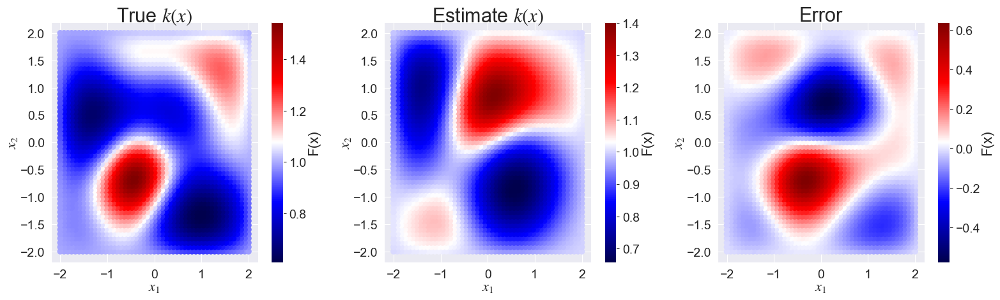

In [ ]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm_3.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm_3.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm_3.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("Error")

fig.tight_layout()

### Second iteration

In [ ]:
hm_3.get_data(1.0)

In [ ]:
measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[ 0.01483737,  0.06972236,  0.01876941, ..., -0.09672661,
          0.00149668, -0.02514891],
        [ 0.06940723,  0.09757674,  0.00500334, ...,  0.13613502,
         -0.04941342,  0.08377173],
        [ 0.04789538, -0.02190484, -0.09207588, ...,  0.09699546,
          0.03104305,  0.03871062],
        ...,
        [-0.02910159,  0.0222603 , -0.10658916, ...,  0.05397587,
          0.13039127,  0.14793121],
        [ 0.09401623,  0.05985476, -0.05636157, ...,  0.05626951,
          0.04942577,  0.03040665],
        [-0.07613814, -0.07867057,  0.05112792, ..., -0.07183673,
          0.04447727, -0.01671055]]),
 (11, 500))

In [ ]:
samples = prob.sample_dist(num_samples=500)
pi_in = prob.dists["pi_up"]

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

Solving model sample set: |██▉                 | ▃▅▇ 73/500 [15%] in 9:13 (~54:26, 0.1/s)                               

# Example from https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12

Used this example to figure out how to set a time dependent forcing function:

In [ ]:
from dolfinx import mesh, fem
from dolfinx.fem import FunctionSpace, Function, Constant
from ufl import TestFunction, dx, inner
import numpy as np
from mpi4py import MPI


class MyExpression:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(x.shape[1], np.sin(self.t) * x[0])


def test():
    """
    Test example from
    https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12
    """
    # If your Expression is not spatially dependent, use Constant
    # f = Constant(mesh, 0)
    # L = inner(f, v)*dx
    # f.value = np.sin(2)
    mesh = mesh.create_unit_square(MPI.COMM_WORLD, 10, 10)
    V = FunctionSpace(mesh, ("CG", 1))
    f = MyExpression()
    f.t = 0
    w = Function(V)
    v = TestFunction(V)
    L = inner(w, v) * dx
    w.interpolate(f.eval)
    fem.form(L)
    # print(fbem.petsc.assemble_vector(fem.form(L)))

# Old results

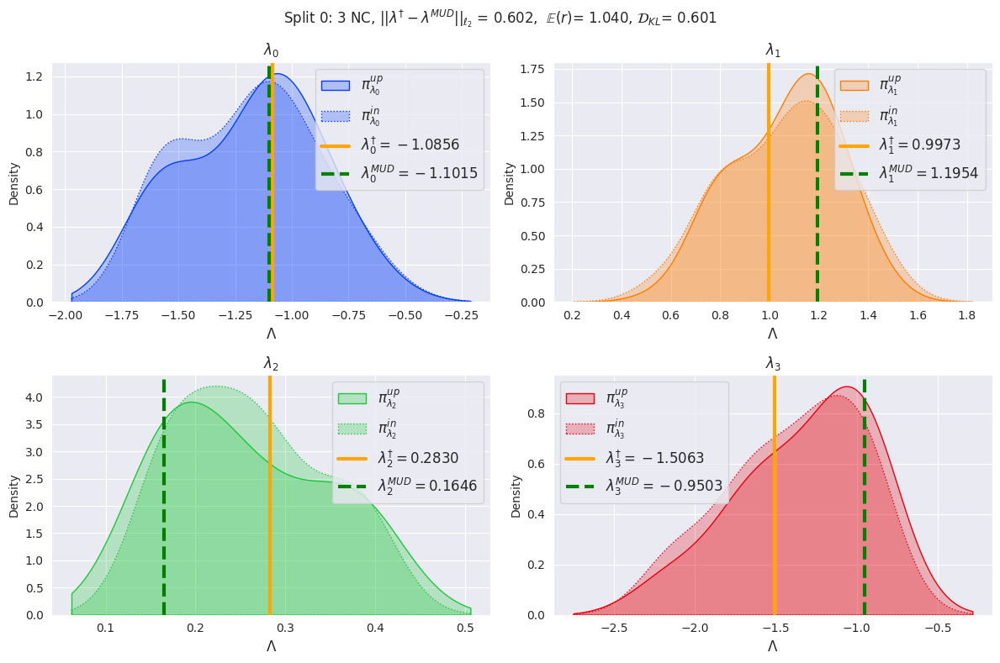

In [ ]:
heat_model.probs[0].param_density_plots(lam_true=heat_model.lam_true)

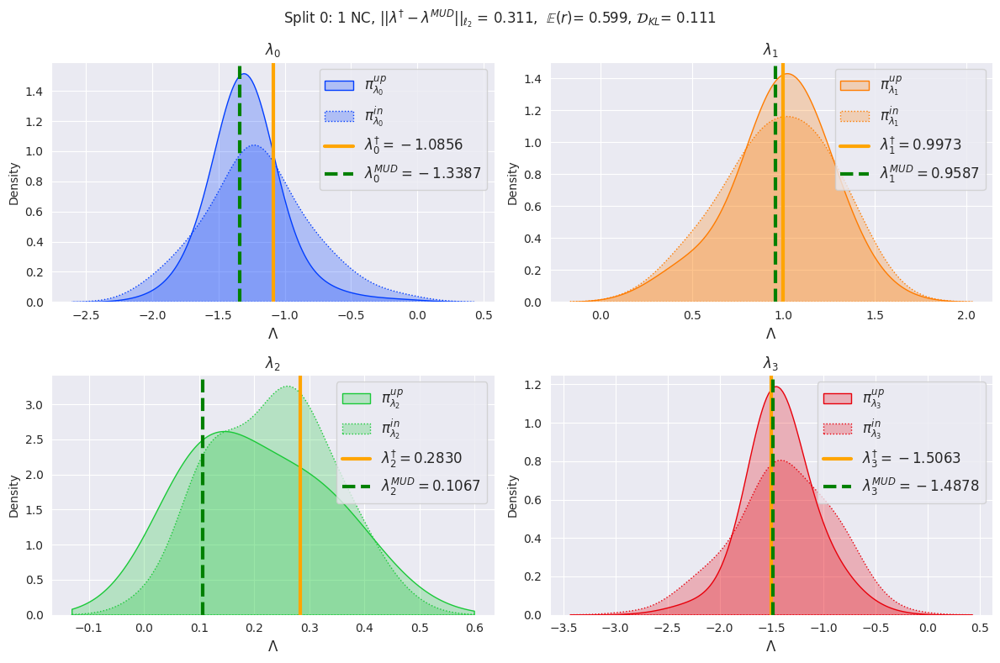

In [ ]:
heat_model.probs[-1].param_density_plots(lam_true=heat_model.lam_true)

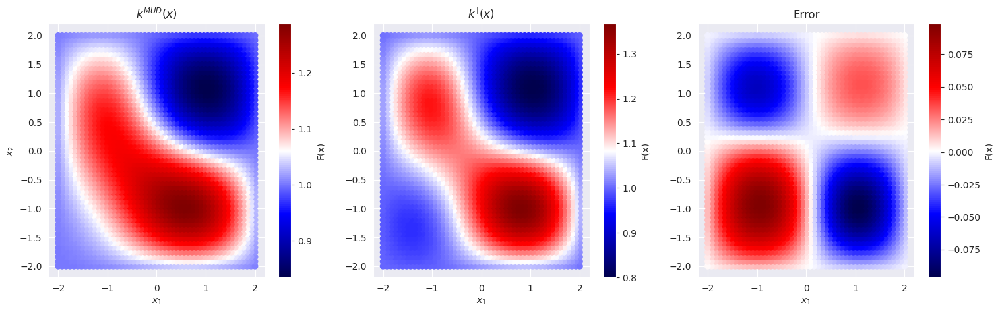

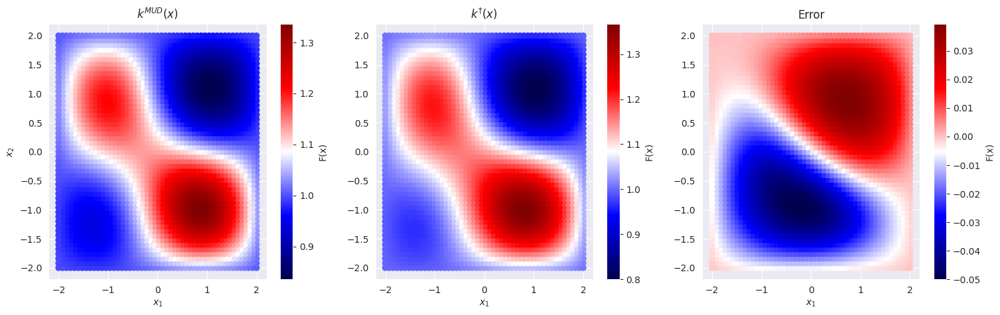

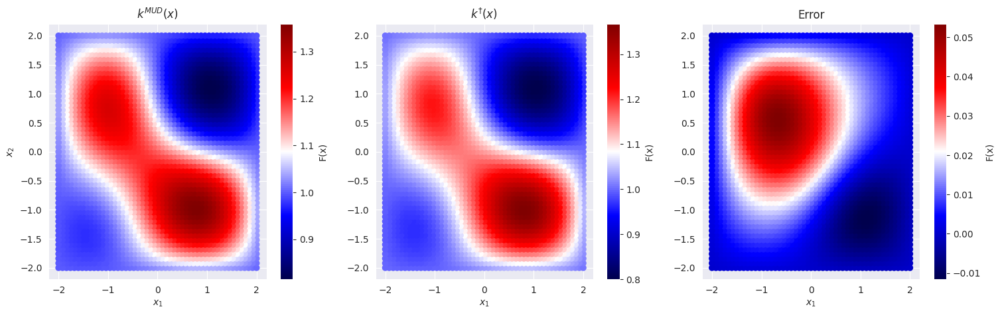

In [ ]:
def plot_field_sol(heat_model, iteration=0):
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    heat_model.plot_field(field=heat_model.probs[iteration].mud_point, ax=ax[0])
    ax[0].set_title("$k^{MUD}(x)$")
    heat_model.plot_field(field=heat_model.lam_true, ax=ax[1])
    ax[1].set_title("$k^{\dagger}(x)$")
    ax[1].set_ylabel("")
    heat_model.plot_field(
        field=heat_model.probs[iteration].mud_point, diff=heat_model.lam_true, ax=ax[2]
    )
    ax[2].set_title("Error")
    ax[2].set_ylabel("")
    fig.tight_layout


for i in range(len(heat_model.probs)):
    plot_field_sol(heat_model, iteration=i)

# Num Modes = 10

Increase number of params

In [ ]:
np.random.seed(123)

importlib.reload(hm)
heat_model2 = hm.HeatModel(nmodes=10, max_states=50)
heat_model2.estimate_params([0.1, 0.2, 0.3, 0.4, 0.5], num_samples=100)

[04/21/23 06:13:30] WARNING  Pyvista not found                                                     ]8;id=37718;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=429962;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py#24\24]8;;\

[04/21/23 06:13:36] INFO     Drawing 100 from uniform at:                                              ]8;id=675452;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=246421;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#251\251]8;;\
                                     loc: [-1.6284459   0.49867272  0.14148925 -2.25944207 -0.86790038             
                             0.82571827                                                                            
                              -3.64001887 -0.64336894  0.63296813 -1.3001106 ]                                     
                                     scale: [1.0856306  0.99734545 0.2829785  1.50629471 0.57860025                
                             1.65143654                                                                            
                              2.42667924 0.42891263 1.26593626 0.8667404 ]                                         

                    INFO     Starting iteration from 0.0 to 0.1                                        ]8;id=313636;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=163885;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#502\502]8;;\

[04/21/23 06:13:37] INFO     end_point: 0.0, [ 0.05486596  0.0069361  -0.04177233 ... -0.04220415      ]8;id=540862;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=198414;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#169\169]8;;\
                             -0.09562734                                                                           
                               0.00950829]                                                                         

Solving model sample set: |██████▋             | ▂▂▄ 33/100 [33%] in 27s (~57s, 

In [ ]:
heat_model2.probs[-1].split_results

e_r        kl  lam_MUD_0  lam_MUD_1  lam_MUD_2   
split nc qoi_comb                                                        
0     1  0         0.565419  0.394487  -0.716982   1.679628   0.570665  \
      2  0         0.216006  0.524723  -0.590240   1.052694   0.300730   
      3  0         0.100875  0.494597  -0.590240   1.052694   0.300730   
      4  0         0.047903  0.434479  -0.590240   1.052694   0.300730   
      5  0         0.004259  0.525457  -1.180029   0.983414   0.447064   
      6  0         0.000816  1.018789  -0.575421   0.587249   0.040367   
      7  0         0.000460  1.079205  -0.575421   0.587249   0.040367   
      8  0         0.000084  1.540604  -1.098010   0.845948   0.011891   
      9  0         0.000043  1.800293  -1.098010   0.845948   0.011891   
      10 0         0.000014  1.646176  -0.716982   1.679628   0.570665   

                   lam_MUD_3  lam_MUD_4  lam_MUD_5  lam_MUD_6  lam_MUD_7   
split nc qoi_comb                                                          
0     1  0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467  \
      2  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      3  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      4  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      5  0         -0.574936  -0.539496   0.049587  -2.999707  -0.253100   
      6  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      7  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      8  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      9  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      10 0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467   

                   lam_MUD_8  lam_MUD_9  predict_delta  within_thresh   
split nc qoi_comb                                                       
0     1  0          2.216736  -1.388417       0.434581           True  \
      2  0         -0.138245  -0.208366       0.783994          False   
      3  0         -0.138245  -0.208366       0.899125          False   
      4  0         -0.138245  -0.208366       0.952097          False   
      5  0          1.418394  -1.759890       0.995741          False   
      6  0          0.576993  -0.406242       0.999184          False   
      7  0          0.576993  -0.406242       0.999540          False   
      8  0          2.135069  -0.120351       0.999916          False   
      9  0          2.135069  -0.120351       0.999957          False   
      10 0          2.216736  -1.388417       0.999986          False   

                   closest  max_kl  min_kl  
split nc qoi_comb                           
0     1  0            True    True    True  
      2  0           False   False   False  
      3  0           False   False   False  
      4  0           False   False   False  
      5  0           False   False   False  
      6  0           False   False   False  
      7  0           False   False   False  
      8  0           False   False   False  
      9  0           False   False   False  
      10 0           False   False   False

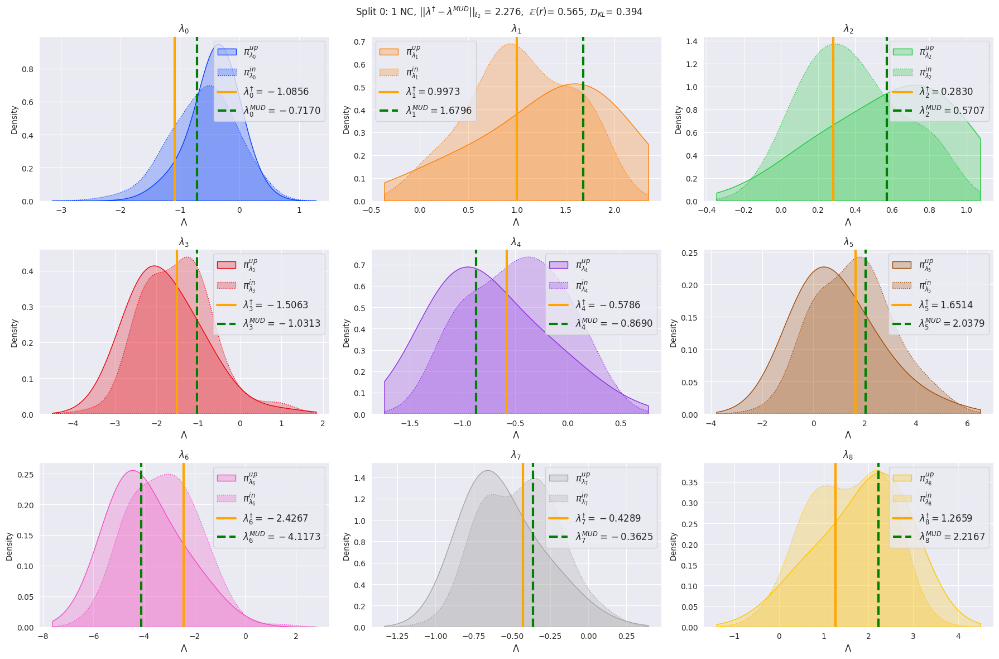

In [ ]:
heat_model2.probs[-1].param_density_plots(lam_true=heat_model2.lam_true)

In [ ]:
heat_model2.probs[-1].mud_point

array([-0.71698221,  1.67962815,  0.57066484, -1.031287  , -0.86897882,
        2.03787551, -4.11730066, -0.36246691,  2.21673642, -1.38841707])

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

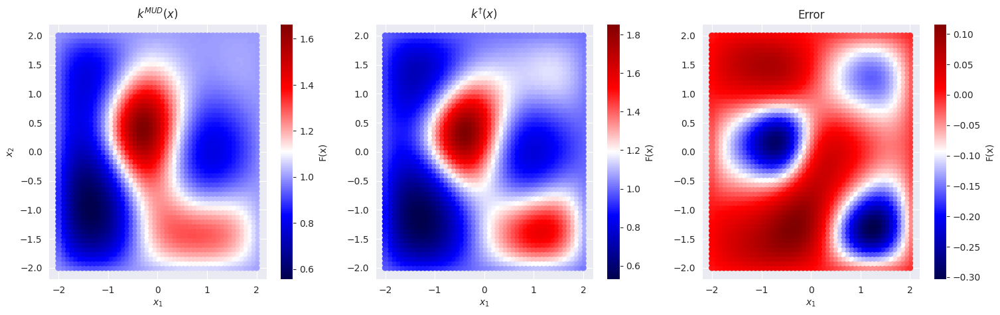

In [ ]:
iteration = 0
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

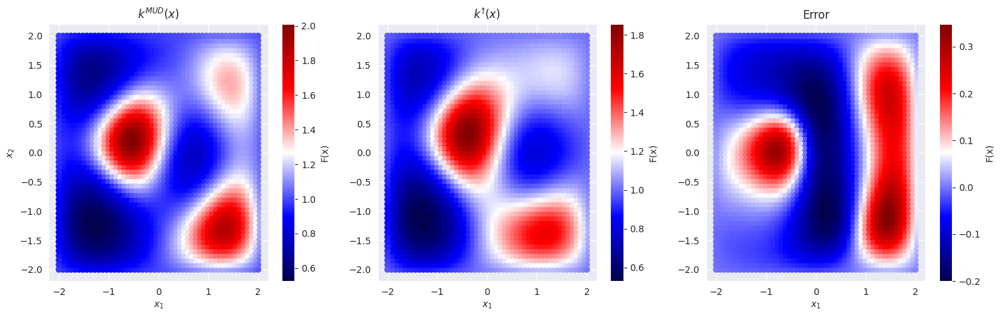

In [ ]:
iteration = -2
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

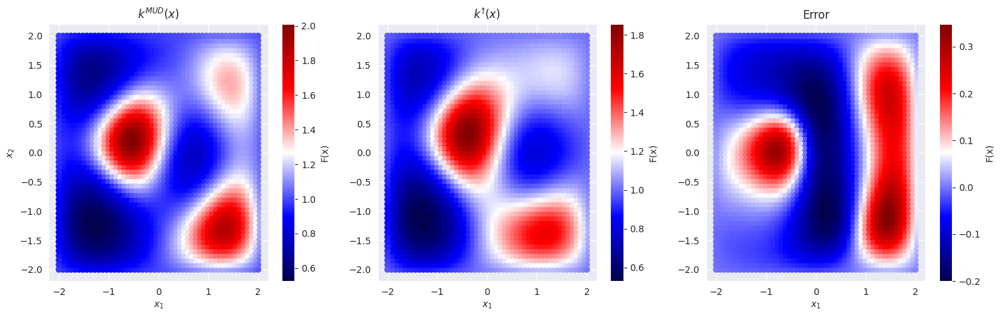

In [ ]:
iteration = -1
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

## Residuals

Lets see the residual between observed and predicted for sample.
Note observed here has no noise yet.

In [ ]:
idx = 1
gif_fname = f"s_{idx}.gif"
heat_model.output_gif(samples.loc[f"s_{idx}"], gif_fname, diff=sol)
Image(url=gif_fname)

|███████████████████████████████████████▊⚠︎ (!) 200/201 [100%] in 8.9s (22.44/s)                                         
